## Project Supply Chain -- Data Exploration

Possible Questions for the Project:

Are customers happier with digital products than with physical ones?

Are customers willing to switch to digital products from physical ones when they had a positive/negative experience

**Exploration of metadata (without Text Mining technics)**
Some ideas (from Maelys):

- Response rate, influence of brand or source, verified_purchase or not

- Distribution of scores.

- Influence of the marketplace or the company on the distribution of notes (hypothesis testin could be used for  this kind of analysis )

- Information about the 10 most active users, with a small analysis on it (distribution of scores, response rate, company...).

**Goal 2 Analysis of text (and cleaning if necessary ). You will need to complete the text mining module to be able to do this part.**
Some ideas :
- Analyze the punctuation according to the note

- Analyze the length of the text (nb character, nb words...) according to the note.

- Analyze the frequency of email addresses, links, phone numbers...

- Occurrence of words, wordcloud...

- N-gram

- Occurrence of some words : delivery order, return order, delivery, SAV, customer service...

In [1]:
# !pip install wordcloud

In [10]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm # color map
import nltk
from nltk.tokenize import word_tokenize
from nltk.util import ngrams
from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.ticker as ticker
import seaborn as sns
import matplotlib.pyplot as plt

import nltk
from nltk.corpus import stopwords
# nltk.download('stopwords')
from nltk.stem import WordNetLemmatizer
# nltk.download('wordnet')

%matplotlib inline

In [11]:
# nltk.download('stopwords')

In [12]:
# nltk.download('punkt')

In [13]:
import os
project_path = os.path.abspath(os.path.join(os.getcwd(), os.path.pardir, os.path.pardir)).replace('\\', '/')
project_path = project_path + '/PROJECT'
project_path

'c:/Users/EQDIYCI/OneDrive - Allianz/TRAININGS/DATASCIENCE_ACADEMY/PROJECT'

In [6]:
data_hc = pd.read_csv(project_path + '/data/raw/amazon_reviews_us_Video_Games_v1_00.tsv', sep="\t", on_bad_lines='skip')  # , error_bad_lines=False For Pandas < 1.3.0
data_dc = pd.read_csv(project_path + '/data/raw/amazon_reviews_us_Digital_Video_Games_v1_00.tsv', sep="\t", on_bad_lines='skip')
data_raw = pd.concat([data_hc,data_dc], axis = 0)

In [7]:
# data_raw.to_csv(project_path + '/data/raw/data_raw.csv', index=False)

### Data Cleansing

In [8]:
data_raw.shape

(1924992, 15)

In [9]:
data_raw.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1924992 entries, 0 to 144723
Data columns (total 15 columns):
 #   Column             Dtype 
---  ------             ----- 
 0   marketplace        object
 1   customer_id        int64 
 2   review_id          object
 3   product_id         object
 4   product_parent     int64 
 5   product_title      object
 6   product_category   object
 7   star_rating        int64 
 8   helpful_votes      int64 
 9   total_votes        int64 
 10  vine               object
 11  verified_purchase  object
 12  review_headline    object
 13  review_body        object
 14  review_date        object
dtypes: int64(5), object(10)
memory usage: 235.0+ MB


In [10]:
data_raw.head()

,marketplace,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,total_votes,vine,verified_purchase,review_headline,review_body,review_date
0,US,12039526,RTIS3L2M1F5SM,B001CXYMFS,737716809,Thrustmaster T-Flight Hotas X Flight Stick,Video Games,5,0,0,N,Y,an amazing joystick. I especially love that yo...,"Used this for Elite Dangerous on my mac, an am...",2015-08-31
1,US,9636577,R1ZV7R40OLHKD,B00M920ND6,569686175,Tonsee 6 buttons Wireless Optical Silent Gamin...,Video Games,5,0,0,N,Y,Definitely a silent mouse... Not a single clic...,"Loved it, I didn't even realise it was a gami...",2015-08-31
2,US,2331478,R3BH071QLH8QMC,B0029CSOD2,98937668,Hidden Mysteries: Titanic Secrets of the Fatef...,Video Games,1,0,1,N,Y,One Star,poor quality work and not as it is advertised.,2015-08-31
3,US,52495923,R127K9NTSXA2YH,B00GOOSV98,23143350,GelTabz Performance Thumb Grips - PlayStation ...,Video Games,3,0,0,N,Y,"good, but could be bettee","nice, but tend to slip away from stick in inte...",2015-08-31
4,US,14533949,R32ZWUXDJPW27Q,B00Y074JOM,821342511,Zero Suit Samus amiibo - Japan Import (Super S...,Video Games,4,0,0,N,Y,Great but flawed.,"Great amiibo, great for collecting. Quality ma...",2015-08-31


In [11]:
# check null data
print(data_raw.isnull().sum(axis = 0))

marketplace           0
customer_id           0
review_id             0
product_id            0
product_parent        0
product_title         0
product_category      0
star_rating           0
helpful_votes         0
total_votes           0
vine                  0
verified_purchase     0
review_headline      41
review_body          98
review_date          30
dtype: int64


In [12]:
# drop missing data, since the amount of missing data is very low
data = data_raw.dropna(axis = 0)

#### check data quality and clean data

In [13]:
# check duplicates
print(data["marketplace"].value_counts()) #Only data from us marketplace, so we can drop the row
print("number of duplicated customer ids = ", len(data[data['customer_id'].duplicated() == True])) #most likely because customers ordered multiple items
print("number of duplicated review ids = ", len(data[data['review_id'].duplicated() == True])) 
#has to be 0 in order to ensure the ID is unique, i think we can drop this row as well in this case
#placeholder for code that shows if product_id, product_title and product_parent are fully correlated
print("product_category: ", data["product_category"].value_counts())
print("star rating: ", data["star_rating"].value_counts())
print("vines: ",data["vine"].value_counts())
print("verified_purchases: ",data["verified_purchase"].value_counts())

marketplace
US    1924825
Name: count, dtype: int64
number of duplicated customer ids =  798956
number of duplicated review ids =  0
product_category:  product_category
Video Games            1780110
Digital_Video_Games     144715
Name: count, dtype: int64
star rating:  star_rating
5    1103299
4     337762
1     216456
3     165030
2     102278
Name: count, dtype: int64
vines:  vine
N    1920541
Y       4284
Name: count, dtype: int64
verified_purchases:  verified_purchase
Y    1288321
N     636504
Name: count, dtype: int64


In [14]:
data.head()

,marketplace,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,total_votes,vine,verified_purchase,review_headline,review_body,review_date
0,US,12039526,RTIS3L2M1F5SM,B001CXYMFS,737716809,Thrustmaster T-Flight Hotas X Flight Stick,Video Games,5,0,0,N,Y,an amazing joystick. I especially love that yo...,"Used this for Elite Dangerous on my mac, an am...",2015-08-31
1,US,9636577,R1ZV7R40OLHKD,B00M920ND6,569686175,Tonsee 6 buttons Wireless Optical Silent Gamin...,Video Games,5,0,0,N,Y,Definitely a silent mouse... Not a single clic...,"Loved it, I didn't even realise it was a gami...",2015-08-31
2,US,2331478,R3BH071QLH8QMC,B0029CSOD2,98937668,Hidden Mysteries: Titanic Secrets of the Fatef...,Video Games,1,0,1,N,Y,One Star,poor quality work and not as it is advertised.,2015-08-31
3,US,52495923,R127K9NTSXA2YH,B00GOOSV98,23143350,GelTabz Performance Thumb Grips - PlayStation ...,Video Games,3,0,0,N,Y,"good, but could be bettee","nice, but tend to slip away from stick in inte...",2015-08-31
4,US,14533949,R32ZWUXDJPW27Q,B00Y074JOM,821342511,Zero Suit Samus amiibo - Japan Import (Super S...,Video Games,4,0,0,N,Y,Great but flawed.,"Great amiibo, great for collecting. Quality ma...",2015-08-31


In [15]:
# check corr
round(data[['customer_id', 'product_parent', 'star_rating', 'helpful_votes', 'total_votes']].corr(),2)

,customer_id,product_parent,star_rating,helpful_votes,total_votes
customer_id,1.00,0.01,-0.05,0.05,0.05
product_parent,0.01,1.00,0.01,-0.00,-0.00
star_rating,-0.05,0.01,1.00,-0.05,-0.11
helpful_votes,0.05,-0.00,-0.05,1.00,0.95
total_votes,0.05,-0.00,-0.11,0.95,1.00


In [16]:
# drop the rows we do not need for this analysis or our model
to_drop = ["marketplace"] # "review_id", "product_id", "product_parent"
data = data.drop(to_drop, axis=1)

In [17]:
data.shape

(1924825, 14)

In [18]:
# data.to_csv(project_path + '/data/raw/data_firstclean.csv', index=False)
# data = pd.read_csv(project_path + '/data/raw/data_firstclean.csv')

### 1st exploration

In [19]:
sns.set_theme(style="whitegrid")

#### reviews per product

<Axes: >

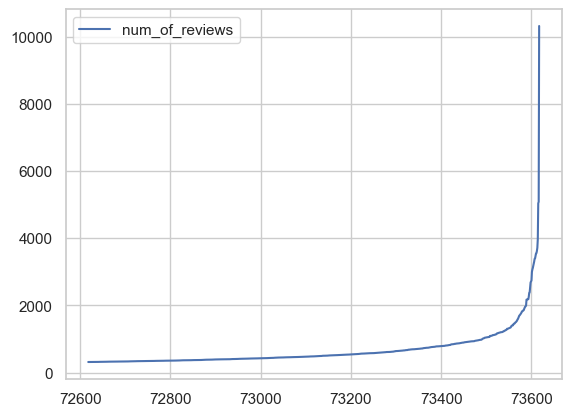

In [20]:
reviews_per_product = data.groupby(["product_id"])["review_id"].nunique().sort_values().reset_index().rename({"review_id":"num_of_reviews"}, axis=1)

reviews_per_product.tail(1000).plot()   

In [21]:
reviews_per_product["num_of_reviews"].quantile([0.01,0.1,0.25, 0.5,0.75,0.9,0.99])

0.01      1.00
0.10      1.00
0.25      1.00
0.50      4.00
0.75     15.00
0.90     51.00
0.99    382.83
Name: num_of_reviews, dtype: float64

#### countplot of various data

<Axes: xlabel='product_category', ylabel='count'>

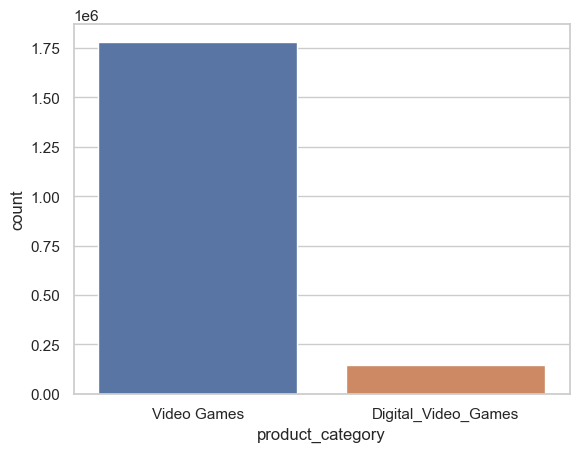

In [22]:
sns.countplot(x=data["product_category"])

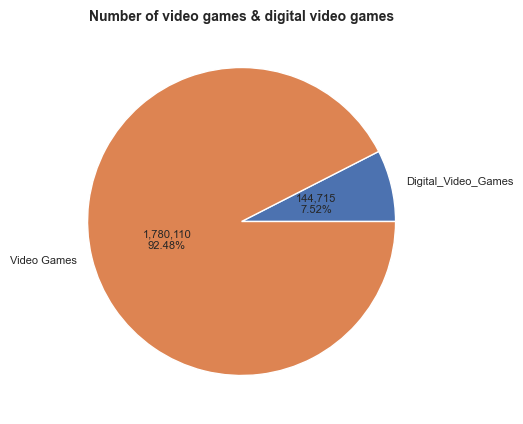

In [23]:
def label_function(val):
    return f'{val / 100 * len(data):,.0f}\n{val:.2f}%'

pie, ax = plt.subplots(figsize=[10,5])
figsize = (10, 5)

data.groupby('product_category').size().plot(kind='pie', 
                                              autopct=label_function, 
                                              textprops={'fontsize': 8},
                                              pctdistance = 0.5
                                            #   cmap = cm.get_cmap('Pastel1')
                                              )

plt.ylabel('', fontsize=8)
plt.title("Number of video games & digital video games", fontsize=10, fontweight='bold')

plt.show()
pie.savefig(project_path + "/dsproject_supply_chain/STREAMLIT_APP/pic/fig_no_video_digital_games.jpg")

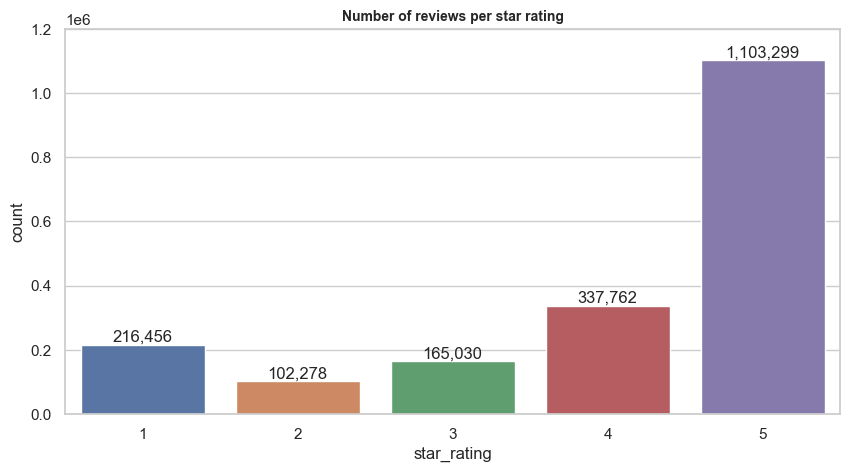

In [24]:
fig, ax = plt.subplots(figsize=[10,5])

sns.countplot(x="star_rating", data=data)
plt.title("Number of reviews per star rating", fontsize=10, fontweight='bold')
ax.bar_label(ax.containers[0],fmt="{:,.0f}")
ax.set(ylim = (0,1200000))

fig.savefig(project_path + "/dsproject_supply_chain/STREAMLIT_APP/pic/fig_no_reviews_per_rating.jpg")

<Axes: xlabel='verified_purchase', ylabel='count'>

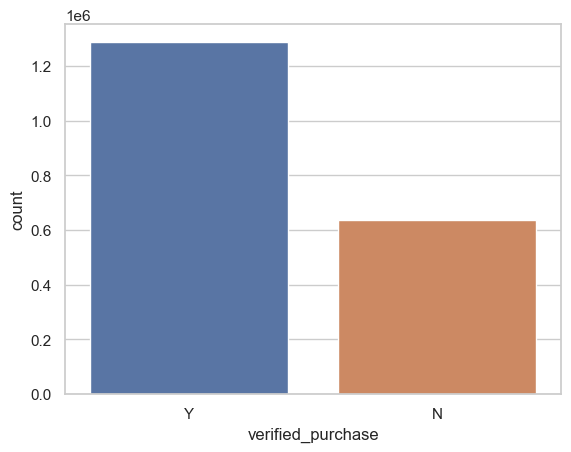

In [25]:
sns.countplot(x=data["verified_purchase"])
#there are a lot of non-verified purchases 
#let's look at how the rating distribution of these reviews looks like compared to the verified ones

In [26]:
data.groupby('verified_purchase').size()

verified_purchase
N     636504
Y    1288321
dtype: int64

C:\Users\EQDIYCI\AppData\Local\Temp\ipykernel_17776\4266587721.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('Pastel1'))


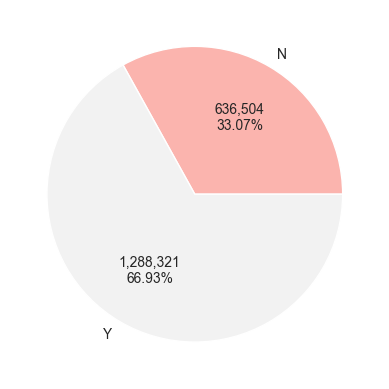

In [27]:
# alternative pie chat of verified and non-verified purchase
def label_function(val):
    return f'{val / 100 * len(data):,.0f}\n{val:.2f}%'

figsize = (10, 5)

data.groupby('verified_purchase').size().plot(kind='pie', 
                                              autopct=label_function, 
                                              textprops={'fontsize': 10},
                                              cmap = cm.get_cmap('Pastel1'))

plt.ylabel('', fontsize=10)

plt.show()

<Axes: xlabel='star_rating', ylabel='count'>

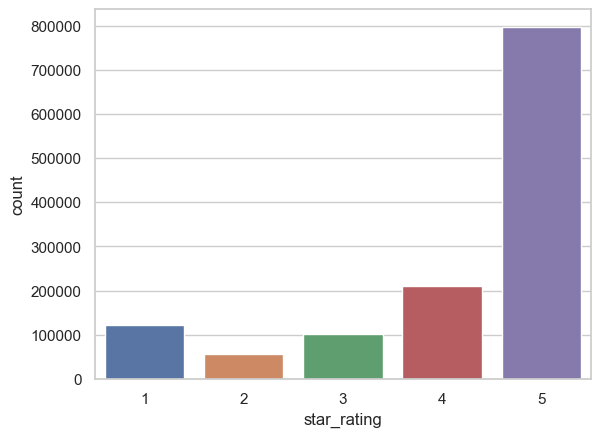

In [28]:
sns.countplot(x=data[data["verified_purchase"]=="Y"]["star_rating"])

C:\Users\EQDIYCI\AppData\Local\Temp\ipykernel_17776\395904524.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('Pastel1'))


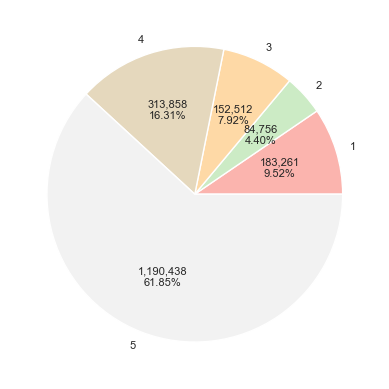

In [29]:
# alternative pie chat of verified and non-verified purchase
def label_function(val):
    return f'{val / 100 * len(data):,.0f}\n{val:.2f}%'

figsize = (10, 5)

data[data["verified_purchase"]=="Y"].groupby('star_rating').size().plot(kind='pie', 
                                              autopct=label_function, 
                                              textprops={'fontsize': 8},
                                              cmap = cm.get_cmap('Pastel1'))

plt.ylabel('', fontsize=10)

plt.show()

C:\Users\EQDIYCI\AppData\Local\Temp\ipykernel_17776\1138250810.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('Pastel1'))


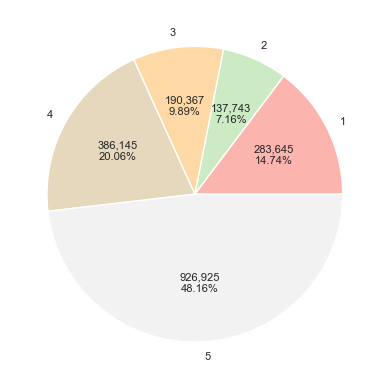

In [30]:
# alternative pie chat of verified and non-verified purchase
def label_function(val):
    return f'{val / 100 * len(data):,.0f}\n{val:.2f}%'

figsize = (10, 5)

data[data["verified_purchase"]=="N"].groupby('star_rating').size().plot(kind='pie', 
                                              autopct=label_function, 
                                              textprops={'fontsize': 8},
                                              cmap = cm.get_cmap('Pastel1'))

plt.ylabel('', fontsize=10)

plt.show()

<Axes: xlabel='star_rating', ylabel='count'>

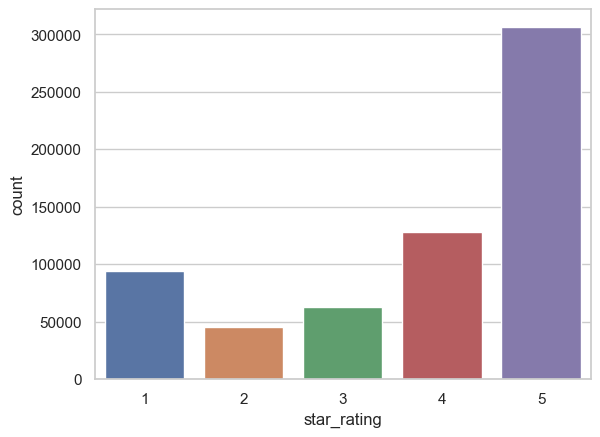

In [31]:
sns.countplot(x=data[data["verified_purchase"]=="N"]["star_rating"])
#there are a lot more lower ratings in comparison. 
#It is possible that customers were so unhappy, that they created a 2nd account just to review the game negatively again

<Axes: xlabel='star_rating', ylabel='count'>

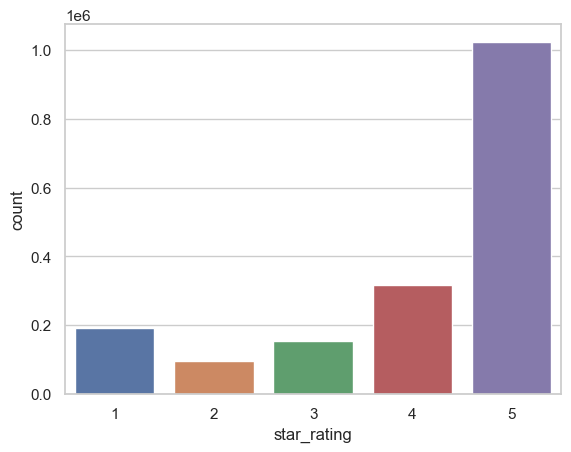

In [32]:
#there are definitely more hard-copy sales than digital sales, let's look at the ratings from the reviews for each one
sns.countplot(x=data[data["product_category"]=="Video Games"]["star_rating"])

<Axes: xlabel='star_rating', ylabel='count'>

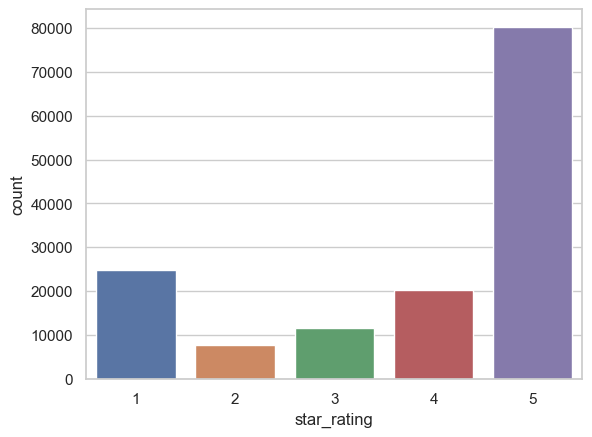

In [33]:
sns.countplot(x=data[data["product_category"]=="Digital_Video_Games"]["star_rating"])
#we can see from this simple analysis, that there are a lot more 1-star reviews for digital products

#### rating problems

In [34]:
data["rating_problems"] = data["star_rating"].apply(lambda x: False if x in [1,2,3,4,5,"1", "2", "3", "4", "5" ] else True) 
data["star_rating"].value_counts(normalize=1)
data["rating_problems"].value_counts(normalize=1)

rating_problems
False    1.0
Name: proportion, dtype: float64

<Axes: xlabel='star_rating', ylabel='count'>

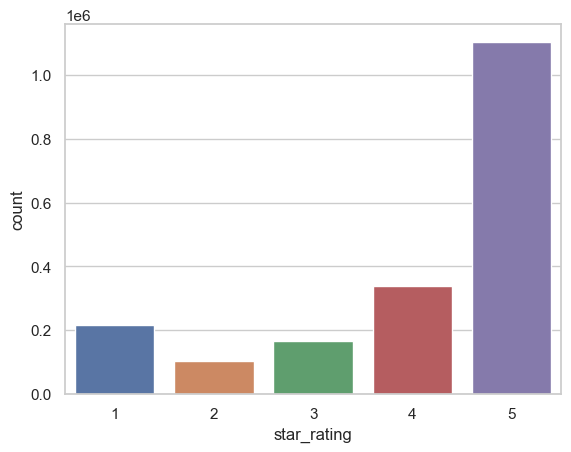

In [35]:
data = data[data["rating_problems"] != True]
data["star_rating"] = data["star_rating"].astype("int")
sns.countplot(x=data["star_rating"]) # Data is very imbalanced across classes

#### reviews over time

In [36]:
data['review_date_year'] = data['review_date'].apply(lambda x: int(x[0:4]))

In [37]:
data[['review_date_year', 'review_date']]

,review_date_year,review_date
0,2015,2015-08-31
1,2015,2015-08-31
2,2015,2015-08-31
3,2015,2015-08-31
4,2015,2015-08-31
...,...,...
144719,2008,2008-12-25
144720,2008,2008-12-24
144721,2008,2008-09-10
144722,2008,2008-09-01


In [38]:
data['review_date_year'].describe()

count    1.924825e+06
mean     2.011561e+03
std      3.856820e+00
min      1.997000e+03
25%      2.010000e+03
50%      2.013000e+03
75%      2.014000e+03
max      2.015000e+03
Name: review_date_year, dtype: float64

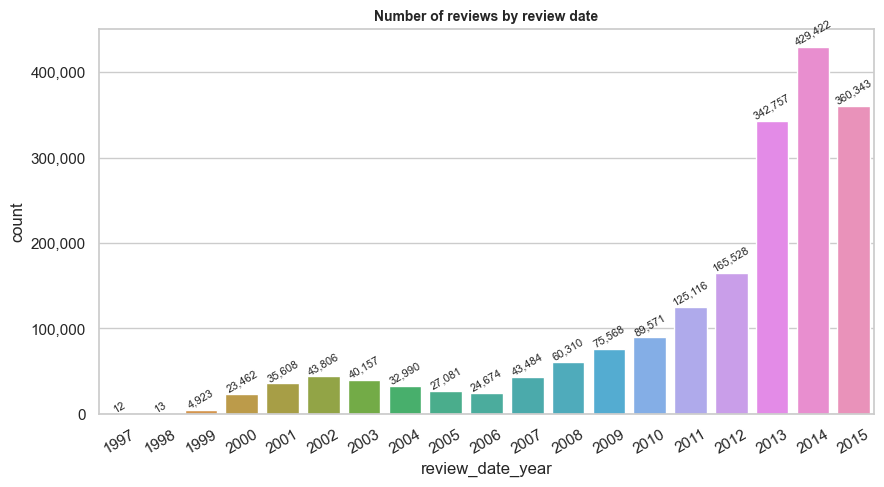

In [39]:
fig, ax = plt.subplots(figsize=[10,5])

sns.countplot(data=data, x='review_date_year')
ax.bar_label(ax.containers[0], rotation=30, fontsize=8, fmt="{:,.0f}")
ax.tick_params(axis='x', rotation=30)
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{:,.0f}'.format(x)))

plt.title("Number of reviews by review date", fontsize=10, fontweight='bold')

plt.savefig(project_path + "/dsproject_supply_chain/STREAMLIT_APP/pic/fig_no_reviews_by_date.jpg")

<Axes: title={'center': 'Reviews per product'}, xlabel='star_rating'>

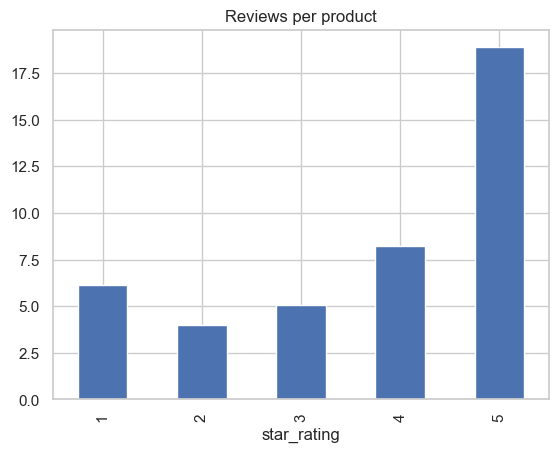

In [40]:
num_rev_prod_per_rating = data.groupby("star_rating").agg({"review_id":lambda x: x.nunique(), "product_id": lambda x: x.nunique()} )
num_rev_prod_per_rating["rev_per_prod"] = num_rev_prod_per_rating.apply(lambda x: x["review_id"] / x["product_id"], axis=1)
num_rev_prod_per_rating["rev_per_prod"].plot(kind="bar", title="Reviews per product")

<Axes: xlabel='star_rating,verified_purchase'>

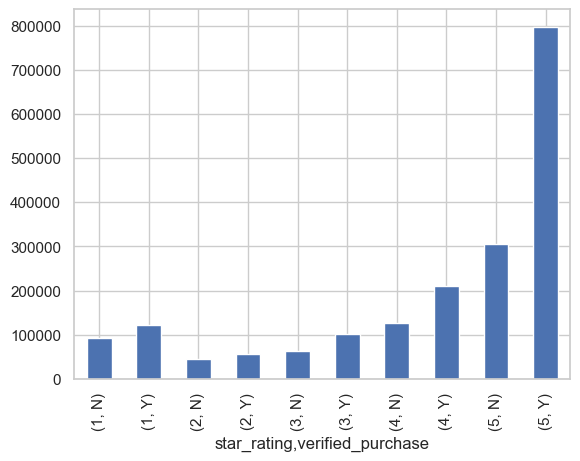

In [41]:
data.groupby(["star_rating", "verified_purchase"])["review_id"].count().plot(kind="bar")

#### 10 most rated titles

<Axes: ylabel='product_title'>

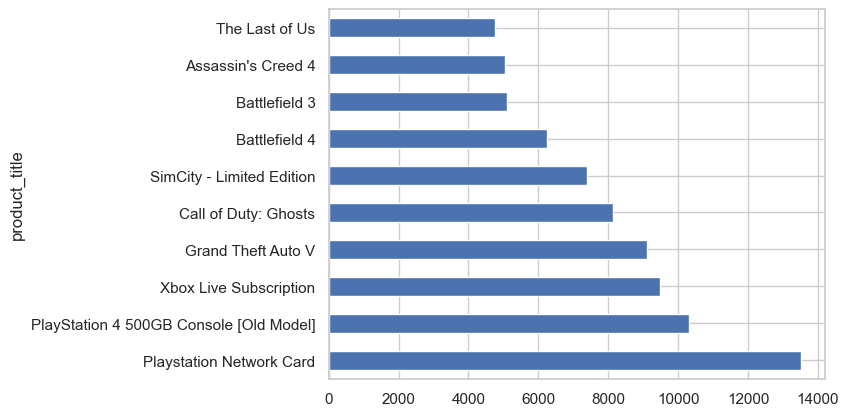

In [42]:
data["product_title"].value_counts().head(10).plot(kind="barh")

#### Top 10 titles where the reviews recieved the most votes

<Axes: ylabel='product_title'>

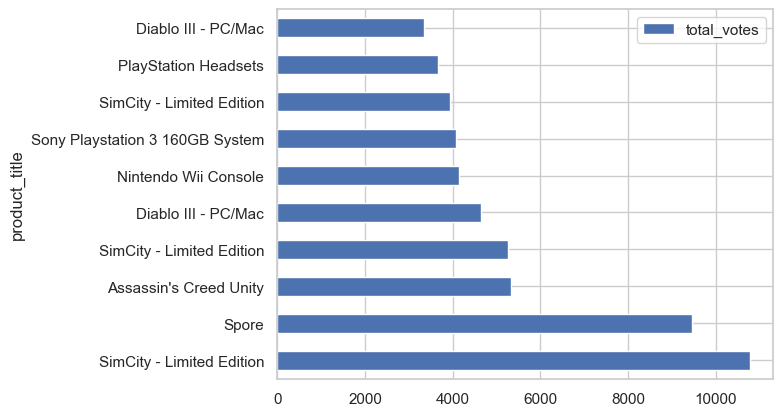

In [43]:
data[["product_title", "total_votes"]].nlargest(10, ["total_votes"]).plot(x="product_title", y="total_votes", kind="barh")

#### Top 10 titles have the most 5-star reviews

<Axes: ylabel='product_title'>

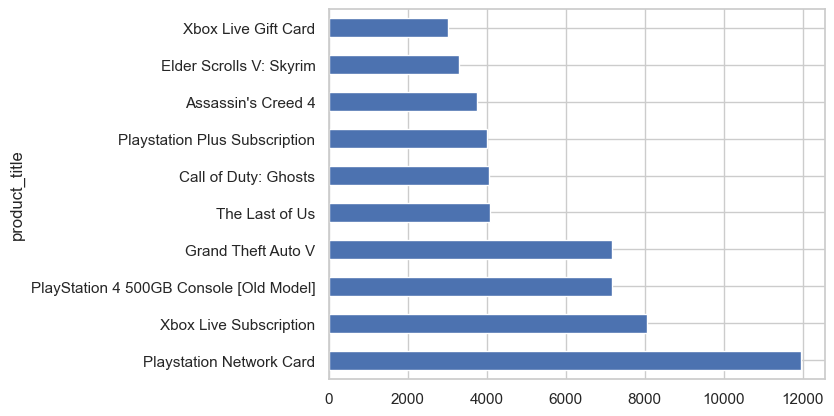

In [44]:
data[data["star_rating"] == 5]["product_title"].value_counts().head(10).plot(kind="barh")

#### Top 10 titles with the lowest rated reviews

<Axes: ylabel='product_title'>

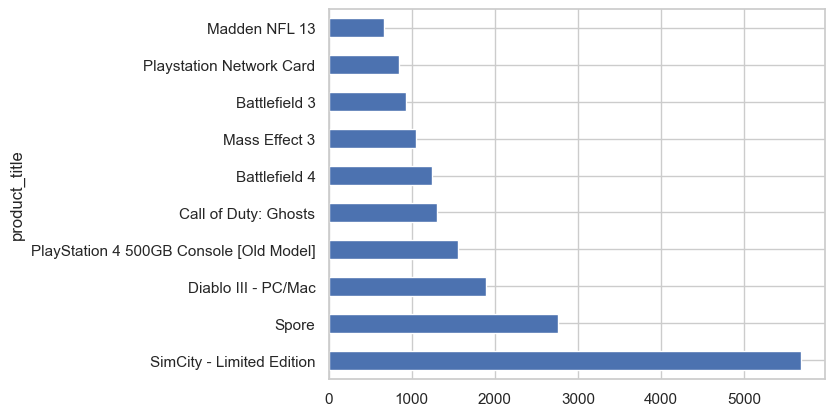

In [45]:
data[data["star_rating"] == 1]["product_title"].value_counts().head(10).plot(kind="barh")
#that's where SimCity went, reviewers did not like this game at all

#### Top 10 games with the most helpful reviews

<Axes: ylabel='product_title'>

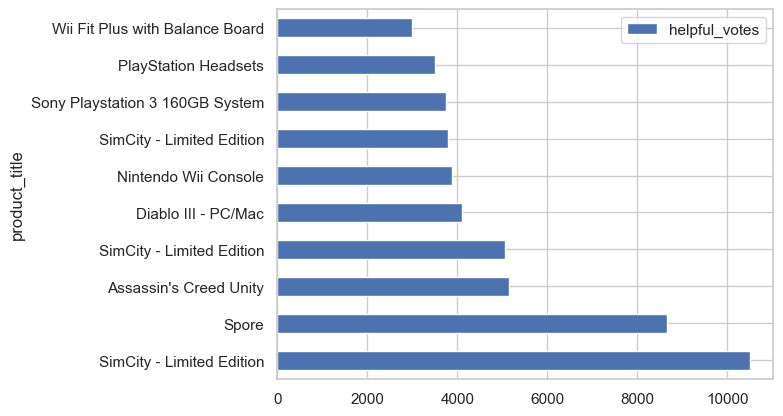

In [46]:
data[["product_title", "helpful_votes"]].nlargest(10, ["helpful_votes"]).plot(x="product_title", y="helpful_votes", kind="barh")
#Customers found reviews of SimCity the most helpful allthough the game also had a lot of bad reviews. this again shows that this title was highly controversial

#### tokenization and stemming of review_body

In [47]:
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))
from nltk.stem.snowball import EnglishStemmer
stemmer = EnglishStemmer()

stop_words.update(["car", "work", "product", "install"])

def tokenization_and_stemming(text):
    tokens = []
    # exclude stop words and tokenize the document, generate a list of string 
    for word in word_tokenize(text):
        if word.lower() not in stop_words:
            tokens.append(word.lower())

    filtered_tokens = []
    
    # filter out any tokens not containing letters (e.g., numeric tokens, raw punctuation)
    for token in tokens:
        if token.isalpha(): # filter out non alphabet words like emoji
            filtered_tokens.append(token)
            
    # stemming
    # Removes ing also in anything ...
    stems = [stemmer.stem(t) for t in filtered_tokens]
    return_string = " ".join(stems)
    
    return return_string

In [48]:
df_review_body = data.dropna(subset=['review_body'])

In [49]:
df_review_body["processed_reviews"] = df_review_body["review_body"].apply(lambda x: tokenization_and_stemming(x))

In [50]:
df_review_body.head()

,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,total_votes,vine,verified_purchase,review_headline,review_body,review_date,rating_problems,review_date_year,processed_reviews
0,12039526,RTIS3L2M1F5SM,B001CXYMFS,737716809,Thrustmaster T-Flight Hotas X Flight Stick,Video Games,5,0,0,N,Y,an amazing joystick. I especially love that yo...,"Used this for Elite Dangerous on my mac, an am...",2015-08-31,False,2015,use elit danger mac amaz joystick especi love ...
1,9636577,R1ZV7R40OLHKD,B00M920ND6,569686175,Tonsee 6 buttons Wireless Optical Silent Gamin...,Video Games,5,0,0,N,Y,Definitely a silent mouse... Not a single clic...,"Loved it, I didn't even realise it was a gami...",2015-08-31,False,2015,love even realis game mous type silent mous se...
2,2331478,R3BH071QLH8QMC,B0029CSOD2,98937668,Hidden Mysteries: Titanic Secrets of the Fatef...,Video Games,1,0,1,N,Y,One Star,poor quality work and not as it is advertised.,2015-08-31,False,2015,poor qualiti advertis
3,52495923,R127K9NTSXA2YH,B00GOOSV98,23143350,GelTabz Performance Thumb Grips - PlayStation ...,Video Games,3,0,0,N,Y,"good, but could be bettee","nice, but tend to slip away from stick in inte...",2015-08-31,False,2015,nice tend slip away stick intens hard press ga...
4,14533949,R32ZWUXDJPW27Q,B00Y074JOM,821342511,Zero Suit Samus amiibo - Japan Import (Super S...,Video Games,4,0,0,N,Y,Great but flawed.,"Great amiibo, great for collecting. Quality ma...",2015-08-31,False,2015,great amiibo great collect qualiti materi desi...


#### word cloud of processed_reviews

In [51]:
data.head(1).T

,0
customer_id,12039526
review_id,RTIS3L2M1F5SM
product_id,B001CXYMFS
product_parent,737716809
product_title,Thrustmaster T-Flight Hotas X Flight Stick
product_category,Video Games
star_rating,5
helpful_votes,0
total_votes,0
vine,N


In [52]:
df_review_body.head(1).T

,0
customer_id,12039526
review_id,RTIS3L2M1F5SM
product_id,B001CXYMFS
product_parent,737716809
product_title,Thrustmaster T-Flight Hotas X Flight Stick
product_category,Video Games
star_rating,5
helpful_votes,0
total_votes,0
vine,N


In [53]:
df_processed_reviews = df_review_body.dropna(subset="processed_reviews")
processed_review_string = df_processed_reviews.groupby("star_rating").aggregate({"processed_reviews":lambda x: " \n ".join(x)})

In [54]:
def wc_for_rating(rating):
    wordcloud = WordCloud(collocations=True).generate(processed_review_string.loc[rating][0][1:5000000].replace("one", "").replace("use", "").replace(" br ", " ").replace("car", "").replace("work", ""))
    # Display the generated image:
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

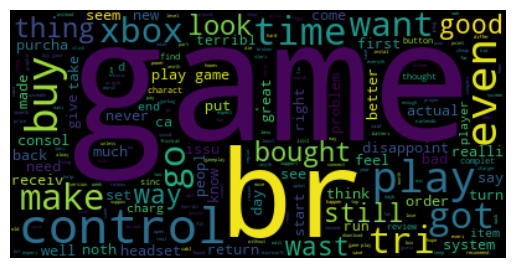

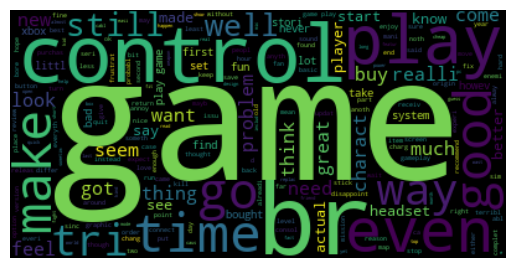

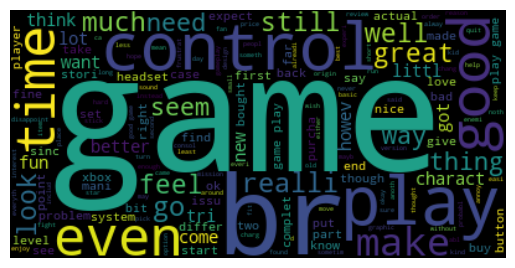

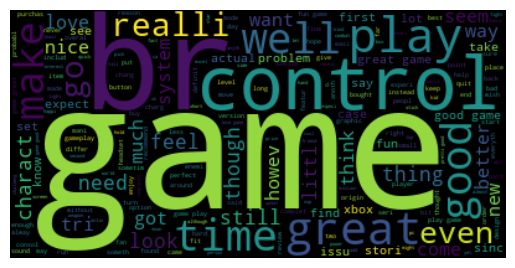

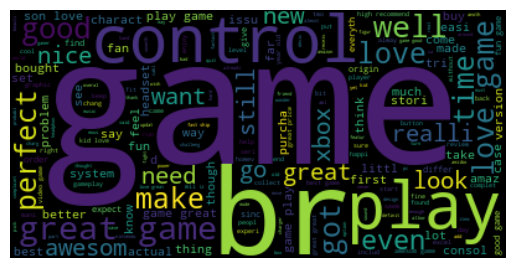

In [55]:
wc_for_rating(1)
wc_for_rating(2)
wc_for_rating(3)
wc_for_rating(4)
wc_for_rating(5)

#### N-Gram

Reference: 

1. https://www.analyticsvidhya.com/blog/2021/09/what-are-n-grams-and-how-to-implement-them-in-python/ 
2. https://www.kaggle.com/code/rtatman/tutorial-getting-n-grams/notebook 



##### pre-processing

In [56]:
# take the sample data for testing code (faster)
# data_test = data.sample(frac=.1)
data_test = data.copy()

In [57]:
# remove special characters
import re

In [58]:
# define function that removes special characters
def remove_special_characters(text):
    return re.sub("[^A-Za-z]+", " ", text).strip()

In [59]:
# remove special characters in the string
data_test['review_headline_wo_punctuations']= data_test['review_headline'].apply(lambda x:remove_special_characters(x))
data_test.head()

,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,total_votes,vine,verified_purchase,review_headline,review_body,review_date,rating_problems,review_date_year,review_headline_wo_punctuations
0,12039526,RTIS3L2M1F5SM,B001CXYMFS,737716809,Thrustmaster T-Flight Hotas X Flight Stick,Video Games,5,0,0,N,Y,an amazing joystick. I especially love that yo...,"Used this for Elite Dangerous on my mac, an am...",2015-08-31,False,2015,an amazing joystick I especially love that you...
1,9636577,R1ZV7R40OLHKD,B00M920ND6,569686175,Tonsee 6 buttons Wireless Optical Silent Gamin...,Video Games,5,0,0,N,Y,Definitely a silent mouse... Not a single clic...,"Loved it, I didn't even realise it was a gami...",2015-08-31,False,2015,Definitely a silent mouse Not a single click w...
2,2331478,R3BH071QLH8QMC,B0029CSOD2,98937668,Hidden Mysteries: Titanic Secrets of the Fatef...,Video Games,1,0,1,N,Y,One Star,poor quality work and not as it is advertised.,2015-08-31,False,2015,One Star
3,52495923,R127K9NTSXA2YH,B00GOOSV98,23143350,GelTabz Performance Thumb Grips - PlayStation ...,Video Games,3,0,0,N,Y,"good, but could be bettee","nice, but tend to slip away from stick in inte...",2015-08-31,False,2015,good but could be bettee
4,14533949,R32ZWUXDJPW27Q,B00Y074JOM,821342511,Zero Suit Samus amiibo - Japan Import (Super S...,Video Games,4,0,0,N,Y,Great but flawed.,"Great amiibo, great for collecting. Quality ma...",2015-08-31,False,2015,Great but flawed


In [60]:
data_test[(data_test['review_headline_wo_punctuations']!= data_test['review_headline']) == True]

,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,total_votes,vine,verified_purchase,review_headline,review_body,review_date,rating_problems,review_date_year,review_headline_wo_punctuations
0,12039526,RTIS3L2M1F5SM,B001CXYMFS,737716809,Thrustmaster T-Flight Hotas X Flight Stick,Video Games,5,0,0,N,Y,an amazing joystick. I especially love that yo...,"Used this for Elite Dangerous on my mac, an am...",2015-08-31,False,2015,an amazing joystick I especially love that you...
1,9636577,R1ZV7R40OLHKD,B00M920ND6,569686175,Tonsee 6 buttons Wireless Optical Silent Gamin...,Video Games,5,0,0,N,Y,Definitely a silent mouse... Not a single clic...,"Loved it, I didn't even realise it was a gami...",2015-08-31,False,2015,Definitely a silent mouse Not a single click w...
3,52495923,R127K9NTSXA2YH,B00GOOSV98,23143350,GelTabz Performance Thumb Grips - PlayStation ...,Video Games,3,0,0,N,Y,"good, but could be bettee","nice, but tend to slip away from stick in inte...",2015-08-31,False,2015,good but could be bettee
4,14533949,R32ZWUXDJPW27Q,B00Y074JOM,821342511,Zero Suit Samus amiibo - Japan Import (Super S...,Video Games,4,0,0,N,Y,Great but flawed.,"Great amiibo, great for collecting. Quality ma...",2015-08-31,False,2015,Great but flawed
12,52738710,R15DUT1VIJ9RJZ,B0053BQN34,577628462,uDraw Gametablet with uDraw Studio,Video Games,2,0,0,N,Y,We have tried it with kids ages 4-7 and none o...,This was way too hard for my kids. We have tri...,2015-08-31,False,2015,We have tried it with kids ages and none of th...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144715,48633721,R1B8ZY4B3QNXAU,B001KC01WO,955209542,Build-a-lot [Download],Digital_Video_Games,4,1,2,N,N,"Lots of fun, for a run or two",You'll get plenty of hours of fun out of this ...,2009-02-03,False,2009,Lots of fun for a run or two
144716,52062256,R3OZBHDT6V61RK,B001KC00HU,631385531,Jewel Quest 2 [Download],Digital_Video_Games,5,27,45,N,N,platform-specific,"Hey, I just burned this one onto a CD, and put...",2009-02-03,False,2009,platform specific
144718,40583756,R3V7BTATZVG5SO,B001AUEITS,163061733,Crazy Machines 2 [Download],Digital_Video_Games,1,2,2,N,N,Should have ordered the disc.,I am now downloading this game for the third t...,2008-12-28,False,2008,Should have ordered the disc
144720,53094564,R3QRKP4DS759BP,B001AU6TQ8,801870836,Crazy Machines 1 - The Wacky Contraptions Game...,Digital_Video_Games,1,13,16,N,N,"The Software May be Great, But I'll Never Know",I downloaded this as a Christmas present for m...,2008-12-24,False,2008,The Software May be Great But I ll Never Know


##### remove stop words

In [61]:
import nltk
from nltk.corpus import stopwords
# nltk.download('stopwords')

In [62]:
# define remove stopwords function
def remove_stopwords(df, col):
    s = df[col].str.lower() # stopwords in the package are all in lower case
    for word in stopwords.words('english'):
        s = s.str.replace("\\b" + word + "\\b", " ", regex=True)
#         print(word + " ", end="")
    return s.str.replace("\\s+", " ", regex=True) # .strip()

# # define function: remove word if the length = 1
# def remove_single_word(s):
#     if len(s) <= 1:
#         return ''
#     else:
#         return s

# define generate_N_grams function
def generate_N_grams(text, ngram):
    text = text.strip()
    words = text.split(" ")
#     print(words)
    if len(words) < ngram:                  
        return '_'.join(words) 
    else: 
        temp=zip(*[words[i:] for i in range(0,ngram)])
        ans=['_'.join(word) for word in temp]
        return " ".join(ans).strip()

In [63]:
# for word in stopwords.words('english'):
#     print(word)

In [64]:
# test function
print(generate_N_grams("Horrible Gave a great trilogy a horrible ending",2))
# print(generate_N_grams("Horrible Gave a great trilogy a horrible ending",1))
# print(*ngrams("Horrible Gave a great trilogy a horrible ending".split(" "), 2))

# remove_stopwords(df_train[df_train.star_rating==5][:5], "review_headline_wo_punctuations")
# df_train[df_train.star_rating==5][:5]['review_headline_wo_punctuations'].str.replace("\\band\\b", "")
# print(generate_N_grams(" best",2)) # _best
# print(generate_N_grams("love ",2)) # love_
generate_N_grams("awesome text", 3)

Horrible_Gave Gave_a a_great great_trilogy trilogy_a a_horrible horrible_ending


'awesome_text'

In [65]:
# Remove stopwords 
data_test['review_headline_wo_punctuations'] = remove_stopwords(data_test, 'review_headline_wo_punctuations')

In [66]:
data_test.head(3).transpose()

,0,1,2
customer_id,12039526,9636577,2331478
review_id,RTIS3L2M1F5SM,R1ZV7R40OLHKD,R3BH071QLH8QMC
product_id,B001CXYMFS,B00M920ND6,B0029CSOD2
product_parent,737716809,569686175,98937668
product_title,Thrustmaster T-Flight Hotas X Flight Stick,Tonsee 6 buttons Wireless Optical Silent Gamin...,Hidden Mysteries: Titanic Secrets of the Fatef...
product_category,Video Games,Video Games,Video Games
star_rating,5,5,1
helpful_votes,0,0,0
total_votes,0,0,1
vine,N,N,N


In [67]:
# check na in the data
print(data_test.review_headline.isna().sum())
print(data_test.star_rating.isna().sum())
# no na data in both columns

0
0


##### define functions for bigrams and trigrams

In [68]:
# define functions for bigrams and trigrams analysis
def generate_N_grams_df(df, column_y, value_y, column_x, n_grams, dict_result):
    for text in df[df[column_y] == value_y][column_x]:
        ngram = generate_N_grams(text, n_grams)
        if len(ngram) == 1 and ngram[0] == "": # skip empty string
            pass
        if len(generate_N_grams(text, n_grams)) < n_grams:
            dict_result[text]+=1
        else:
            for word in generate_N_grams(text, n_grams).split(" "):
                dict_result[word]+=1
    
    df_result = pd.DataFrame.from_dict(dict_result, orient = 'index')
    df_result = df_result.rename(columns={0:'# words'}).sort_values(by=['# words']).reset_index()
    
    return df_result

##### create graphs

###### unigram

In [86]:
from collections import defaultdict

n_grams = 1

rating_5 = defaultdict(int)
rating_4 = defaultdict(int)
rating_3 = defaultdict(int)
rating_2 = defaultdict(int)
rating_1 = defaultdict(int)

In [87]:
# Create string with n-grams
# get the count of every word in both the columns of df_train and df_test dataframes where star_rating=5
for text in data_test[data_test.star_rating==5].review_headline_wo_punctuations:
    for word in generate_N_grams(text, n_grams).split(" "):
        rating_5[word]+=1

In [88]:
# convert dict to df
df_rating_5 = pd.DataFrame.from_dict(rating_5, orient = 'index')
df_rating_5 = df_rating_5.rename(columns={0:'# words'}).sort_values(by=['# words']).reset_index()
df_rating_5.tail(5)

,index,# words
52002,best,59831
52003,great,161351
52004,game,184464
52005,five,214666
52006,stars,216933


In [89]:
# Create string with n-grams
# get the count of every word in both the columns of df_train and df_test dataframes where star_rating=1
for text in data_test[data_test.star_rating==1].review_headline_wo_punctuations:
    for word in generate_N_grams(text, n_grams).split(" "):
        rating_1[word]+=1

# convert dict to df
df_rating_1 = pd.DataFrame.from_dict(rating_1, orient = 'index')
df_rating_1 = df_rating_1.rename(columns={0:'# words'}).sort_values(by=['# words']).reset_index()
df_rating_1.tail(5)

,index,# words
23615,work,11378
23616,buy,12062
23617,star,18613
23618,one,21067
23619,game,25774


In [90]:
for text in data_test[data_test.star_rating==2].review_headline_wo_punctuations:
    for word in generate_N_grams(text, n_grams).split(" "):
        rating_2[word]+=1

# convert dict to df
df_rating_2 = pd.DataFrame.from_dict(rating_2, orient = 'index')
df_rating_2 = df_rating_2.rename(columns={0:'# words'}).sort_values(by=['# words']).reset_index()
df_rating_2.tail(5)

,index,# words
16931,great,4145
16932,good,5642
16933,stars,6555
16934,two,6663
16935,game,11667


In [92]:
for text in data_test[data_test.star_rating==3].review_headline_wo_punctuations:
    for word in generate_N_grams(text, n_grams).split(" "):
        rating_3[word]+=1

# convert dict to df
df_rating_3 = pd.DataFrame.from_dict(rating_3, orient = 'index')
df_rating_3 = df_rating_3.rename(columns={0:'# words'}).sort_values(by=['# words']).reset_index()
df_rating_3.tail(5)

,index,# words
21545,great,11095
21546,three,13874
21547,stars,14456
21548,good,16992
21549,game,22493


In [93]:
for text in data_test[data_test.star_rating==4].review_headline_wo_punctuations:
    for word in generate_N_grams(text, n_grams).split(" "):
        rating_4[word]+=1

# convert dict to df
df_rating_4 = pd.DataFrame.from_dict(rating_4, orient = 'index')
df_rating_4 = df_rating_4.rename(columns={0:'# words'}).sort_values(by=['# words']).reset_index()
df_rating_4.tail(5)

,index,# words
29318,four,31914
29319,stars,32898
29320,good,44050
29321,great,46840
29322,game,64416


In [94]:
#focus on more frequently occuring words for top and lowest ratings
#sort in DO wrt 2nd column in each of top and lowest ratings
df_rating_5['index'][-10:]

51997       ever
51998       love
51999    awesome
52000       good
52001        fun
52002       best
52003      great
52004       game
52005       five
52006      stars
Name: index, dtype: object

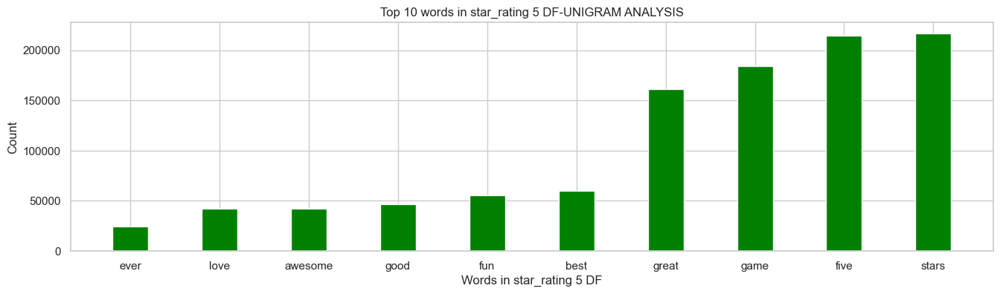

In [95]:
plt.figure(1,figsize=(16,4))
plt.bar(df_rating_5['index'][-10:], df_rating_5['# words'][-10:], color ='green', width = 0.4)
plt.xlabel("Words in star_rating 5 DF")
plt.ylabel("Count")
plt.title("Top 10 words in star_rating 5 DF-UNIGRAM ANALYSIS")
plt.show()

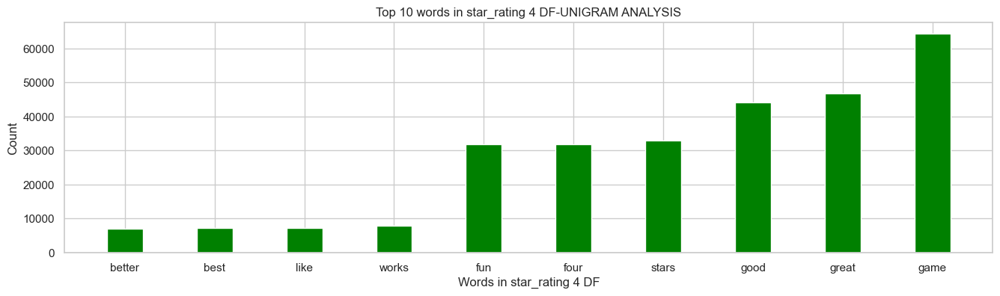

In [96]:
plt.figure(1,figsize=(16,4))
plt.bar(df_rating_4['index'][-10:], df_rating_4['# words'][-10:], color ='green', width = 0.4)
plt.xlabel("Words in star_rating 4 DF")
plt.ylabel("Count")
plt.title("Top 10 words in star_rating 4 DF-UNIGRAM ANALYSIS")
plt.show()

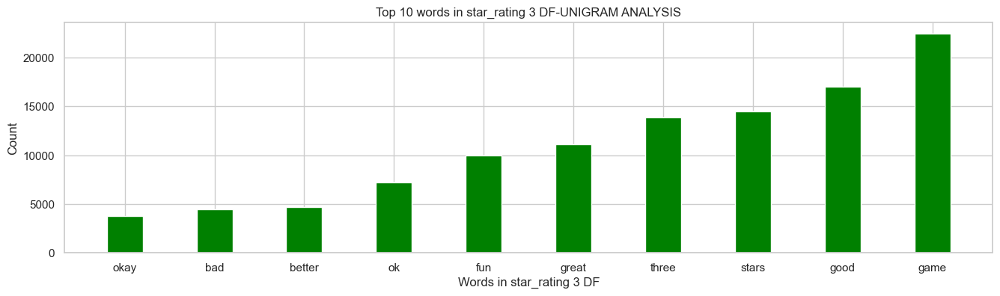

In [97]:
plt.figure(1,figsize=(16,4))
plt.bar(df_rating_3['index'][-10:], df_rating_3['# words'][-10:], color ='green', width = 0.4)
plt.xlabel("Words in star_rating 3 DF")
plt.ylabel("Count")
plt.title("Top 10 words in star_rating 3 DF-UNIGRAM ANALYSIS")
plt.show()

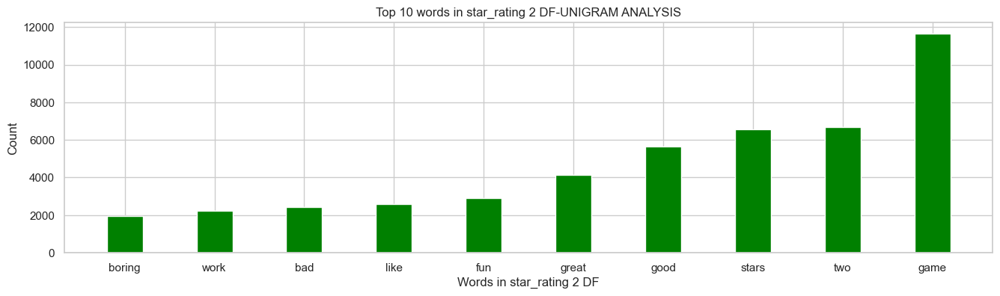

In [98]:
plt.figure(1,figsize=(16,4))
plt.bar(df_rating_2['index'][-10:], df_rating_2['# words'][-10:], color ='green', width = 0.4)
plt.xlabel("Words in star_rating 2 DF")
plt.ylabel("Count")
plt.title("Top 10 words in star_rating 2 DF-UNIGRAM ANALYSIS")
plt.show()

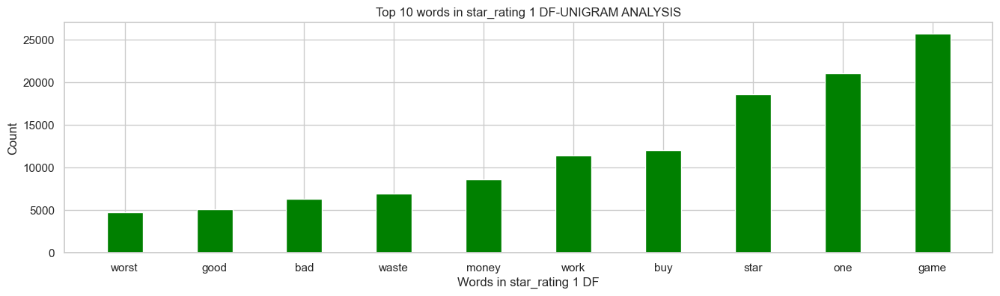

In [99]:
plt.figure(1,figsize=(16,4))
plt.bar(df_rating_1['index'][-10:], df_rating_1['# words'][-10:], color ='green', width = 0.4)
plt.xlabel("Words in star_rating 1 DF")
plt.ylabel("Count")
plt.title("Top 10 words in star_rating 1 DF-UNIGRAM ANALYSIS")
plt.show()

###### bigrams

In [102]:
from collections import defaultdict

rating_5 = defaultdict(int)
rating_4 = defaultdict(int)
rating_3 = defaultdict(int)
rating_2 = defaultdict(int)
rating_1 = defaultdict(int)

In [104]:
df_rating_5 = generate_N_grams_df(df = data_test, column_y = "star_rating", value_y = 5, 
                    column_x = "review_headline_wo_punctuations", n_grams = 2, 
                    dict_result = rating_5)

In [105]:
df_rating_5.tail(10)

,index,# words
1270035,the_best,13248
1270036,love,14613
1270037,best_game,15220
1270038,game_ever,15741
1270039,of_the,18108
1270040,awesome,18412
1270041,great,20078
1270042,great_game,50535
1270043,Five_Stars,213162
1270044,five_stars,214349


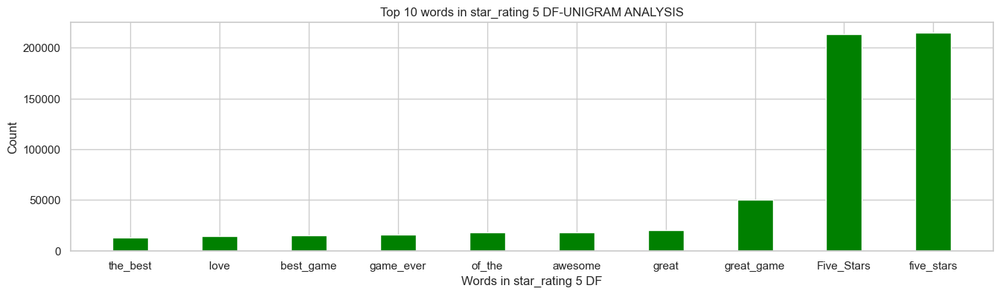

In [106]:
plt.figure(1,figsize=(16,4))
plt.bar(df_rating_5['index'][-10:], df_rating_5['# words'][-10:], color ='green', width = 0.4)
plt.xlabel("Words in star_rating 5 DF")
plt.ylabel("Count")
plt.title("Top 10 words in star_rating 5 DF-UNIGRAM ANALYSIS")
plt.show()

In [108]:
df_rating_4 = generate_N_grams_df(df = data_test, column_y = "star_rating", value_y = 4, 
                    column_x = "review_headline_wo_punctuations", n_grams = 2, 
                    dict_result = rating_4)

In [109]:
df_rating_4.tail(10)

,index,# words
633547,Great_game,3728
633548,pretty_good,4116
633549,of_the,4304
633550,good,4515
633551,for_the,6251
633552,fun_game,7314
633553,good_game,12861
633554,great_game,15943
633555,Four_Stars,31703
633556,four_stars,31792


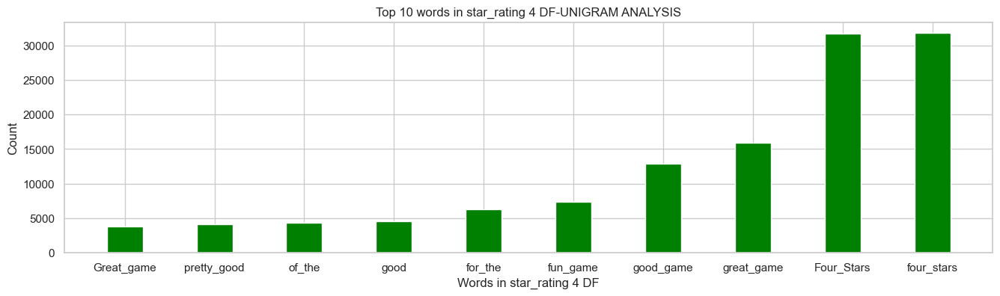

In [110]:
plt.figure(1,figsize=(16,4))
plt.bar(df_rating_4['index'][-10:], df_rating_4['# words'][-10:], color ='green', width = 0.4)
plt.xlabel("Words in star_rating 4 DF")
plt.ylabel("Count")
plt.title("Top 10 words in star_rating 4 DF-UNIGRAM ANALYSIS")
plt.show()

In [111]:
df_rating_3 = generate_N_grams_df(df = data_test, column_y = "star_rating", value_y = 3, 
                    column_x = "review_headline_wo_punctuations", n_grams = 2, 
                    dict_result = rating_3)

In [112]:
df_rating_3.tail(10)

,index,# words
171875,meh,1033
171876,,1050
171877,good,1078
171878,could_better,1141
171879,fun_game,1412
171880,okay,1760
171881,great_game,2168
171882,good_game,3020
171883,ok,3142
171884,three_stars,13744


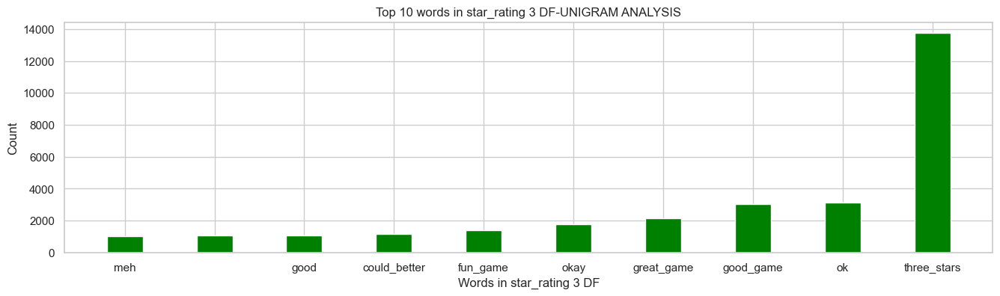

In [113]:
plt.figure(1,figsize=(16,4))
plt.bar(df_rating_3['index'][-10:], df_rating_3['# words'][-10:], color ='green', width = 0.4)
plt.xlabel("Words in star_rating 3 DF")
plt.ylabel("Count")
plt.title("Top 10 words in star_rating 3 DF-UNIGRAM ANALYSIS")
plt.show()

In [115]:
df_rating_2 = generate_N_grams_df(df = data_test, column_y = "star_rating", value_y = 2, 
                    column_x = "review_headline_wo_punctuations", n_grams = 2, 
                    dict_result = rating_2)

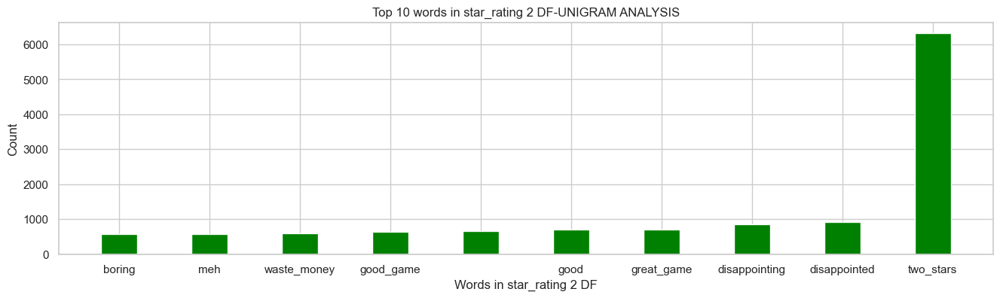

In [116]:
plt.figure(1,figsize=(16,4))
plt.bar(df_rating_2['index'][-10:], df_rating_2['# words'][-10:], color ='green', width = 0.4)
plt.xlabel("Words in star_rating 2 DF")
plt.ylabel("Count")
plt.title("Top 10 words in star_rating 2 DF-UNIGRAM ANALYSIS")
plt.show()

In [119]:
df_rating_1 = generate_N_grams_df(df = data_test[data_test['star_rating'] == 1], 
                                  column_y = "star_rating", value_y = 1, 
                                  column_x = "review_headline_wo_punctuations", n_grams = 2, 
                                  dict_result = rating_1)

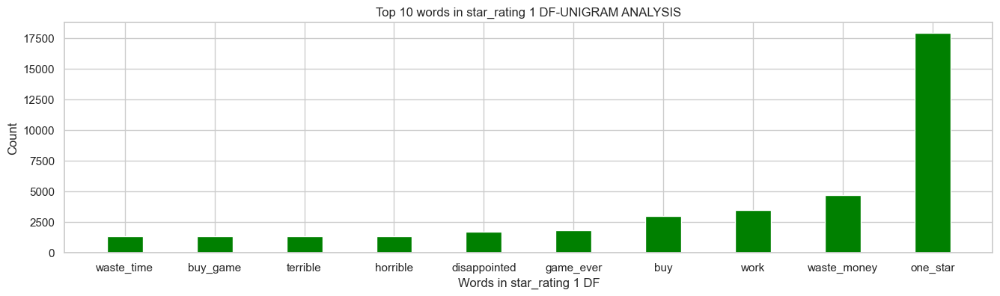

In [120]:
plt.figure(1,figsize=(16,4))
plt.bar(df_rating_1['index'][-10:], df_rating_1['# words'][-10:], color ='green', width = 0.4)
plt.xlabel("Words in star_rating 1 DF")
plt.ylabel("Count")
plt.title("Top 10 words in star_rating 1 DF-UNIGRAM ANALYSIS")
plt.show()

###### trigrams

In [121]:
from collections import defaultdict

rating_5 = defaultdict(int)
rating_4 = defaultdict(int)
rating_3 = defaultdict(int)
rating_2 = defaultdict(int)
rating_1 = defaultdict(int)

In [122]:
df_rating_5 = generate_N_grams_df(df = data_test, column_y = "star_rating", value_y = 5, 
                    column_x = "review_headline_wo_punctuations", n_grams = 3, 
                    dict_result = rating_5)

In [123]:
df_rating_4 = generate_N_grams_df(df = data_test, column_y = "star_rating", value_y = 4, 
                    column_x = "review_headline_wo_punctuations", n_grams = 3, 
                    dict_result = rating_4)

In [124]:
df_rating_3 = generate_N_grams_df(df = data_test, column_y = "star_rating", value_y = 3, 
                    column_x = "review_headline_wo_punctuations", n_grams = 3, 
                    dict_result = rating_3)

In [125]:
df_rating_2 = generate_N_grams_df(df = data_test, column_y = "star_rating", value_y = 2, 
                    column_x = "review_headline_wo_punctuations", n_grams = 3, 
                    dict_result = rating_2)

In [126]:
df_rating_1 = generate_N_grams_df(df = data_test, column_y = "star_rating", value_y = 1, 
                    column_x = "review_headline_wo_punctuations", n_grams = 3, 
                    dict_result = rating_1)

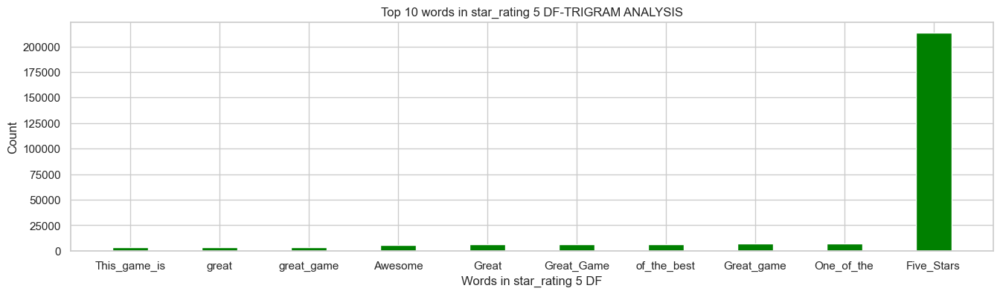

In [127]:
plt.figure(1,figsize=(16,4))
plt.bar(df_rating_5['index'][-10:], df_rating_5['# words'][-10:], color ='green', width = 0.4)
plt.xlabel("Words in star_rating 5 DF")
plt.ylabel("Count")
plt.title("Top 10 words in star_rating 5 DF-TRIGRAM ANALYSIS")
plt.show()

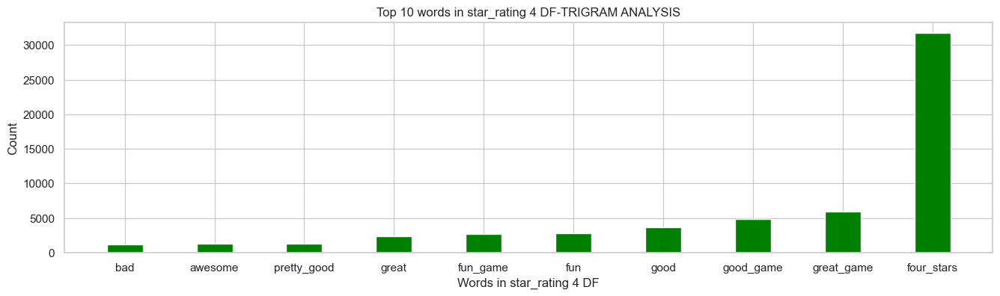

In [128]:
plt.figure(1,figsize=(16,4))
plt.bar(df_rating_4['index'][-10:], df_rating_4['# words'][-10:], color ='green', width = 0.4)
plt.xlabel("Words in star_rating 4 DF")
plt.ylabel("Count")
plt.title("Top 10 words in star_rating 4 DF-TRIGRAM ANALYSIS")
plt.show()

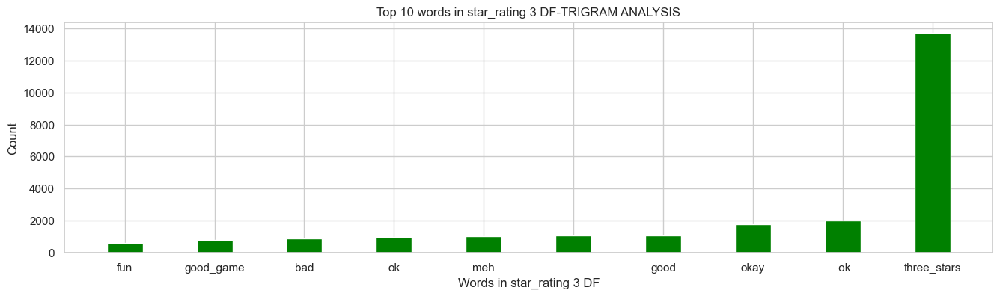

In [129]:
plt.figure(1,figsize=(16,4))
plt.bar(df_rating_3['index'][-10:], df_rating_3['# words'][-10:], color ='green', width = 0.4)
plt.xlabel("Words in star_rating 3 DF")
plt.ylabel("Count")
plt.title("Top 10 words in star_rating 3 DF-TRIGRAM ANALYSIS")
plt.show()

In [130]:
df_rating_3[(df_rating_3['index'].str.strip() == '') == True]

,index,# words
203061,,251
203083,,1050


In [131]:
df_rating_3 = df_rating_3[(df_rating_3['index'].str.strip() == '') == False]

In [132]:
df_rating_3.tail(10)

,index,# words
203077,good_great,517
203078,fun,607
203079,good_game,797
203080,bad,892
203081,ok,996
203082,meh,1033
203084,good,1078
203085,okay,1760
203086,ok,2023
203087,three_stars,13699


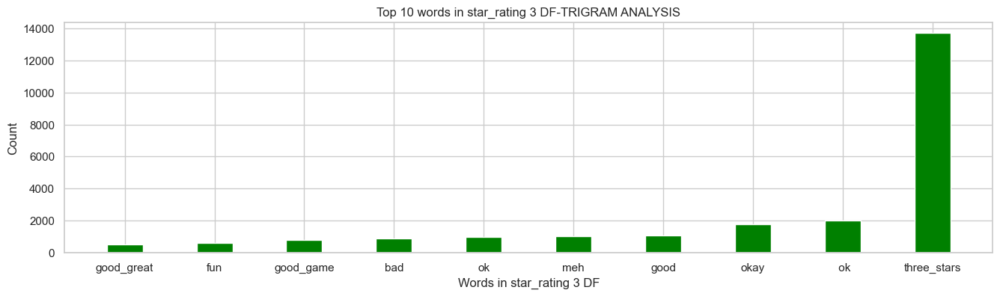

In [133]:
# in the top 10 contains empty space -- > drop it (need to modify the n_gram function)
plt.figure(1,figsize=(16,4))
plt.bar(df_rating_3['index'][-10:], df_rating_3['# words'][-10:], color ='green', width = 0.4)
plt.xlabel("Words in star_rating 3 DF")
plt.ylabel("Count")
plt.title("Top 10 words in star_rating 3 DF-TRIGRAM ANALYSIS")
plt.show()

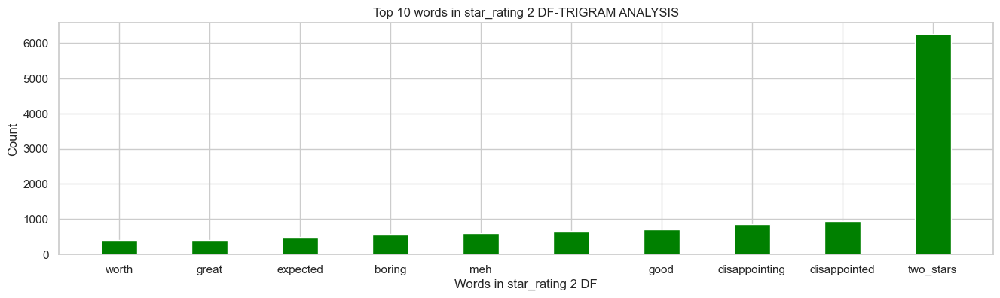

In [134]:
plt.figure(1,figsize=(16,4))
plt.bar(df_rating_2['index'][-10:], df_rating_2['# words'][-10:], color ='green', width = 0.4)
plt.xlabel("Words in star_rating 2 DF")
plt.ylabel("Count")
plt.title("Top 10 words in star_rating 2 DF-TRIGRAM ANALYSIS")
plt.show()

In [135]:
df_rating_2 = df_rating_2[(df_rating_2['index'].str.strip() == '') == False]
df_rating_2.tail(10)

,index,# words
125482,waste_money,375
125483,worth,403
125484,great,405
125485,expected,488
125486,boring,580
125487,meh,587
125489,good,700
125490,disappointing,856
125491,disappointed,931
125492,two_stars,6267


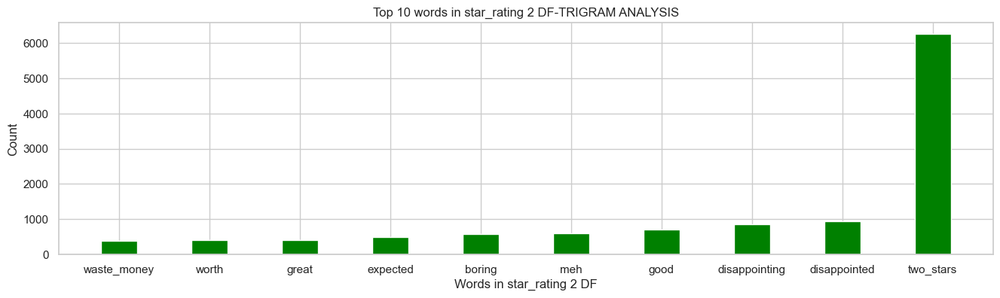

In [136]:
plt.figure(1,figsize=(16,4))
plt.bar(df_rating_2['index'][-10:], df_rating_2['# words'][-10:], color ='green', width = 0.4)
plt.xlabel("Words in star_rating 2 DF")
plt.ylabel("Count")
plt.title("Top 10 words in star_rating 2 DF-TRIGRAM ANALYSIS")
plt.show()

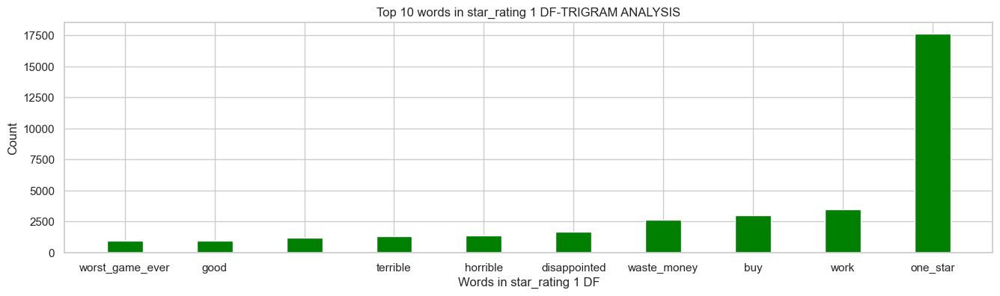

In [137]:
plt.figure(1,figsize=(16,4))
plt.bar(df_rating_1['index'][-10:], df_rating_1['# words'][-10:], color ='green', width = 0.4)
plt.xlabel("Words in star_rating 1 DF")
plt.ylabel("Count")
plt.title("Top 10 words in star_rating 1 DF-TRIGRAM ANALYSIS")
plt.show()

In [138]:
df_rating_1 = df_rating_1[(df_rating_1['index'].str.strip() == '') == False]
df_rating_1.tail(10)

,index,# words
227221,bad,812
227222,worst_game_ever,934
227223,good,951
227225,terrible,1347
227226,horrible,1354
227227,disappointed,1700
227228,waste_money,2647
227229,buy,2983
227230,work,3473
227231,one_star,17651


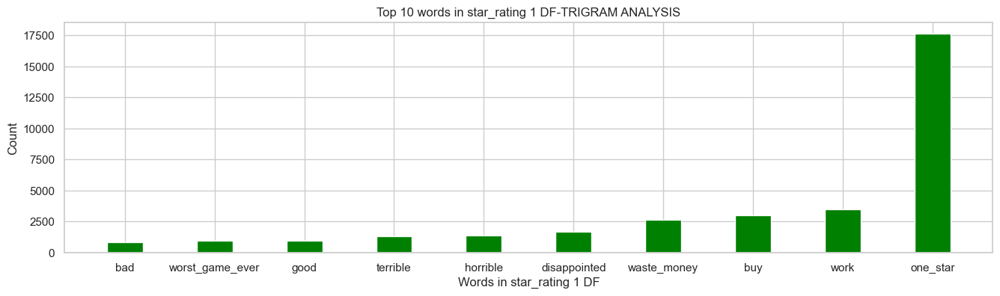

In [139]:
plt.figure(1,figsize=(16,4))
plt.bar(df_rating_1['index'][-10:], df_rating_1['# words'][-10:], color ='green', width = 0.4)
plt.xlabel("Words in star_rating 1 DF")
plt.ylabel("Count")
plt.title("Top 10 words in star_rating 1 DF-TRIGRAM ANALYSIS")
plt.show()

### 2nd Data Exploration (2023-01-12)

#### Further data cleasing

In [140]:
import warnings
warnings.filterwarnings('ignore')

In [141]:
#converting to lower case
data['review_body'] = data['review_body'].astype(str).str.lower()
data['review_headline'] = data['review_headline'].astype(str).str.lower()
data.head()

,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,total_votes,vine,verified_purchase,review_headline,review_body,review_date,rating_problems,review_date_year
0,12039526,RTIS3L2M1F5SM,B001CXYMFS,737716809,Thrustmaster T-Flight Hotas X Flight Stick,Video Games,5,0,0,N,Y,an amazing joystick. i especially love that yo...,"used this for elite dangerous on my mac, an am...",2015-08-31,False,2015
1,9636577,R1ZV7R40OLHKD,B00M920ND6,569686175,Tonsee 6 buttons Wireless Optical Silent Gamin...,Video Games,5,0,0,N,Y,definitely a silent mouse... not a single clic...,"loved it, i didn't even realise it was a gami...",2015-08-31,False,2015
2,2331478,R3BH071QLH8QMC,B0029CSOD2,98937668,Hidden Mysteries: Titanic Secrets of the Fatef...,Video Games,1,0,1,N,Y,one star,poor quality work and not as it is advertised.,2015-08-31,False,2015
3,52495923,R127K9NTSXA2YH,B00GOOSV98,23143350,GelTabz Performance Thumb Grips - PlayStation ...,Video Games,3,0,0,N,Y,"good, but could be bettee","nice, but tend to slip away from stick in inte...",2015-08-31,False,2015
4,14533949,R32ZWUXDJPW27Q,B00Y074JOM,821342511,Zero Suit Samus amiibo - Japan Import (Super S...,Video Games,4,0,0,N,Y,great but flawed.,"great amiibo, great for collecting. quality ma...",2015-08-31,False,2015


##### some tests before cleansing

In [142]:
#removing punctuation and converting to lower case
import re
import string

def text_clean1(text):
    text = text.lower()
    text = re.sub('[%s]' % re.escape(string.punctuation),'',text)
    return text

cleaned1 = lambda x: text_clean1(x)

In [143]:
#sample data to test code
data_subsample = data.iloc[0:100]

# using function on columns
data_subsample['cleaned_reviewheadline'] = data_subsample['review_headline'].apply(cleaned1)
data_subsample['cleaned_reviewbody'] = data_subsample['review_body'].apply(cleaned1)


#Another round of cleaning
def text_clean2(text):
    text = re.sub('\n','', text)
    return text

In [144]:
cleaned2 = lambda x: text_clean2(x)
data_subsample['cleaned_reviewheadline'] = data_subsample['cleaned_reviewheadline'].apply(cleaned2)
data_subsample['cleaned_reviewbody'] = data_subsample['cleaned_reviewbody'].apply(cleaned2)

data_subsample.head()

,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,total_votes,vine,verified_purchase,review_headline,review_body,review_date,rating_problems,review_date_year,cleaned_reviewheadline,cleaned_reviewbody
0,12039526,RTIS3L2M1F5SM,B001CXYMFS,737716809,Thrustmaster T-Flight Hotas X Flight Stick,Video Games,5,0,0,N,Y,an amazing joystick. i especially love that yo...,"used this for elite dangerous on my mac, an am...",2015-08-31,False,2015,an amazing joystick i especially love that you...,used this for elite dangerous on my mac an ama...
1,9636577,R1ZV7R40OLHKD,B00M920ND6,569686175,Tonsee 6 buttons Wireless Optical Silent Gamin...,Video Games,5,0,0,N,Y,definitely a silent mouse... not a single clic...,"loved it, i didn't even realise it was a gami...",2015-08-31,False,2015,definitely a silent mouse not a single click w...,loved it i didnt even realise it was a gaming...
2,2331478,R3BH071QLH8QMC,B0029CSOD2,98937668,Hidden Mysteries: Titanic Secrets of the Fatef...,Video Games,1,0,1,N,Y,one star,poor quality work and not as it is advertised.,2015-08-31,False,2015,one star,poor quality work and not as it is advertised
3,52495923,R127K9NTSXA2YH,B00GOOSV98,23143350,GelTabz Performance Thumb Grips - PlayStation ...,Video Games,3,0,0,N,Y,"good, but could be bettee","nice, but tend to slip away from stick in inte...",2015-08-31,False,2015,good but could be bettee,nice but tend to slip away from stick in inten...
4,14533949,R32ZWUXDJPW27Q,B00Y074JOM,821342511,Zero Suit Samus amiibo - Japan Import (Super S...,Video Games,4,0,0,N,Y,great but flawed.,"great amiibo, great for collecting. quality ma...",2015-08-31,False,2015,great but flawed,great amiibo great for collecting quality mate...


In [145]:
#Remove Stopwords
stopwords = stopwords.words('english')
data_subsample['cleaned_reviewbody'] = data_subsample['cleaned_reviewbody'].apply(lambda words: ' '.join(word.lower() for word in words.split()if word not in stopwords))
data_subsample.head()

[nltk_data] Error loading stopwords: <urlopen error Tunnel connection
[nltk_data]     failed: 407 Proxy Authentication Required>


,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,total_votes,vine,verified_purchase,review_headline,review_body,review_date,rating_problems,review_date_year,cleaned_reviewheadline,cleaned_reviewbody
0,12039526,RTIS3L2M1F5SM,B001CXYMFS,737716809,Thrustmaster T-Flight Hotas X Flight Stick,Video Games,5,0,0,N,Y,an amazing joystick. i especially love that yo...,"used this for elite dangerous on my mac, an am...",2015-08-31,False,2015,an amazing joystick i especially love that you...,used elite dangerous mac amazing joystick espe...
1,9636577,R1ZV7R40OLHKD,B00M920ND6,569686175,Tonsee 6 buttons Wireless Optical Silent Gamin...,Video Games,5,0,0,N,Y,definitely a silent mouse... not a single clic...,"loved it, i didn't even realise it was a gami...",2015-08-31,False,2015,definitely a silent mouse not a single click w...,loved didnt even realise gaming mouse typed 34...
2,2331478,R3BH071QLH8QMC,B0029CSOD2,98937668,Hidden Mysteries: Titanic Secrets of the Fatef...,Video Games,1,0,1,N,Y,one star,poor quality work and not as it is advertised.,2015-08-31,False,2015,one star,poor quality work advertised
3,52495923,R127K9NTSXA2YH,B00GOOSV98,23143350,GelTabz Performance Thumb Grips - PlayStation ...,Video Games,3,0,0,N,Y,"good, but could be bettee","nice, but tend to slip away from stick in inte...",2015-08-31,False,2015,good but could be bettee,nice tend slip away stick intense hard pressed...
4,14533949,R32ZWUXDJPW27Q,B00Y074JOM,821342511,Zero Suit Samus amiibo - Japan Import (Super S...,Video Games,4,0,0,N,Y,great but flawed.,"great amiibo, great for collecting. quality ma...",2015-08-31,False,2015,great but flawed,great amiibo great collecting quality material...


In [146]:
#Tokenization
nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer

def lemmatize_text(text):
    lemmatizer = WordNetLemmatizer()
    return ' '.join([lemmatizer.lemmatize(w) for w in text.split(' ')])

data_subsample['tokenized_reviewbody'] = data_subsample['cleaned_reviewbody'].apply(lemmatize_text)
data_subsample.head()

[nltk_data] Error loading wordnet: <urlopen error Tunnel connection
[nltk_data]     failed: 407 Proxy Authentication Required>


,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,total_votes,vine,verified_purchase,review_headline,review_body,review_date,rating_problems,review_date_year,cleaned_reviewheadline,cleaned_reviewbody,tokenized_reviewbody
0,12039526,RTIS3L2M1F5SM,B001CXYMFS,737716809,Thrustmaster T-Flight Hotas X Flight Stick,Video Games,5,0,0,N,Y,an amazing joystick. i especially love that yo...,"used this for elite dangerous on my mac, an am...",2015-08-31,False,2015,an amazing joystick i especially love that you...,used elite dangerous mac amazing joystick espe...,used elite dangerous mac amazing joystick espe...
1,9636577,R1ZV7R40OLHKD,B00M920ND6,569686175,Tonsee 6 buttons Wireless Optical Silent Gamin...,Video Games,5,0,0,N,Y,definitely a silent mouse... not a single clic...,"loved it, i didn't even realise it was a gami...",2015-08-31,False,2015,definitely a silent mouse not a single click w...,loved didnt even realise gaming mouse typed 34...,loved didnt even realise gaming mouse typed 34...
2,2331478,R3BH071QLH8QMC,B0029CSOD2,98937668,Hidden Mysteries: Titanic Secrets of the Fatef...,Video Games,1,0,1,N,Y,one star,poor quality work and not as it is advertised.,2015-08-31,False,2015,one star,poor quality work advertised,poor quality work advertised
3,52495923,R127K9NTSXA2YH,B00GOOSV98,23143350,GelTabz Performance Thumb Grips - PlayStation ...,Video Games,3,0,0,N,Y,"good, but could be bettee","nice, but tend to slip away from stick in inte...",2015-08-31,False,2015,good but could be bettee,nice tend slip away stick intense hard pressed...,nice tend slip away stick intense hard pressed...
4,14533949,R32ZWUXDJPW27Q,B00Y074JOM,821342511,Zero Suit Samus amiibo - Japan Import (Super S...,Video Games,4,0,0,N,Y,great but flawed.,"great amiibo, great for collecting. quality ma...",2015-08-31,False,2015,great but flawed,great amiibo great collecting quality material...,great amiibo great collecting quality material...


In [147]:
from nltk.tokenize import RegexpTokenizer
tokenizer = RegexpTokenizer(r'w+')
data_subsample['tokenizedbody'] = data_subsample['cleaned_reviewbody'].apply(tokenizer.tokenize)
data_subsample.head()

,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,total_votes,vine,verified_purchase,review_headline,review_body,review_date,rating_problems,review_date_year,cleaned_reviewheadline,cleaned_reviewbody,tokenized_reviewbody,tokenizedbody
0,12039526,RTIS3L2M1F5SM,B001CXYMFS,737716809,Thrustmaster T-Flight Hotas X Flight Stick,Video Games,5,0,0,N,Y,an amazing joystick. i especially love that yo...,"used this for elite dangerous on my mac, an am...",2015-08-31,False,2015,an amazing joystick i especially love that you...,used elite dangerous mac amazing joystick espe...,used elite dangerous mac amazing joystick espe...,"[w, w, w]"
1,9636577,R1ZV7R40OLHKD,B00M920ND6,569686175,Tonsee 6 buttons Wireless Optical Silent Gamin...,Video Games,5,0,0,N,Y,definitely a silent mouse... not a single clic...,"loved it, i didn't even realise it was a gami...",2015-08-31,False,2015,definitely a silent mouse not a single click w...,loved didnt even realise gaming mouse typed 34...,loved didnt even realise gaming mouse typed 34...,"[w, w]"
2,2331478,R3BH071QLH8QMC,B0029CSOD2,98937668,Hidden Mysteries: Titanic Secrets of the Fatef...,Video Games,1,0,1,N,Y,one star,poor quality work and not as it is advertised.,2015-08-31,False,2015,one star,poor quality work advertised,poor quality work advertised,[w]
3,52495923,R127K9NTSXA2YH,B00GOOSV98,23143350,GelTabz Performance Thumb Grips - PlayStation ...,Video Games,3,0,0,N,Y,"good, but could be bettee","nice, but tend to slip away from stick in inte...",2015-08-31,False,2015,good but could be bettee,nice tend slip away stick intense hard pressed...,nice tend slip away stick intense hard pressed...,[w]
4,14533949,R32ZWUXDJPW27Q,B00Y074JOM,821342511,Zero Suit Samus amiibo - Japan Import (Super S...,Video Games,4,0,0,N,Y,great but flawed.,"great amiibo, great for collecting. quality ma...",2015-08-31,False,2015,great but flawed,great amiibo great collecting quality material...,great amiibo great collecting quality material...,[]


In [148]:
#Text Exploratory Analysis
data_subsample['word_length'] = data_subsample['cleaned_reviewbody'].str.split().str.len()
data_subsample.head()
def sentiment(row):
    if row['star_rating'] == 5:
        return "Positive"
    elif row['star_rating'] == 1:
        return "Negative"
    elif  1 < row['star_rating'] < 5:
        return "Inbetween"
    else:
        return "Undefined"
    

data_subsample['star_sentiment'] = data_subsample.apply(sentiment,axis =1)
data_subsample.head()

,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,total_votes,vine,...,review_body,review_date,rating_problems,review_date_year,cleaned_reviewheadline,cleaned_reviewbody,tokenized_reviewbody,tokenizedbody,word_length,star_sentiment
0,12039526,RTIS3L2M1F5SM,B001CXYMFS,737716809,Thrustmaster T-Flight Hotas X Flight Stick,Video Games,5,0,0,N,...,"used this for elite dangerous on my mac, an am...",2015-08-31,False,2015,an amazing joystick i especially love that you...,used elite dangerous mac amazing joystick espe...,used elite dangerous mac amazing joystick espe...,"[w, w, w]",17,Positive
1,9636577,R1ZV7R40OLHKD,B00M920ND6,569686175,Tonsee 6 buttons Wireless Optical Silent Gamin...,Video Games,5,0,0,N,...,"loved it, i didn't even realise it was a gami...",2015-08-31,False,2015,definitely a silent mouse not a single click w...,loved didnt even realise gaming mouse typed 34...,loved didnt even realise gaming mouse typed 34...,"[w, w]",25,Positive
2,2331478,R3BH071QLH8QMC,B0029CSOD2,98937668,Hidden Mysteries: Titanic Secrets of the Fatef...,Video Games,1,0,1,N,...,poor quality work and not as it is advertised.,2015-08-31,False,2015,one star,poor quality work advertised,poor quality work advertised,[w],4,Negative
3,52495923,R127K9NTSXA2YH,B00GOOSV98,23143350,GelTabz Performance Thumb Grips - PlayStation ...,Video Games,3,0,0,N,...,"nice, but tend to slip away from stick in inte...",2015-08-31,False,2015,good but could be bettee,nice tend slip away stick intense hard pressed...,nice tend slip away stick intense hard pressed...,[w],10,Inbetween
4,14533949,R32ZWUXDJPW27Q,B00Y074JOM,821342511,Zero Suit Samus amiibo - Japan Import (Super S...,Video Games,4,0,0,N,...,"great amiibo, great for collecting. quality ma...",2015-08-31,False,2015,great but flawed,great amiibo great collecting quality material...,great amiibo great collecting quality material...,[],9,Inbetween


array([[<Axes: title={'center': 'word_length'}>]], dtype=object)

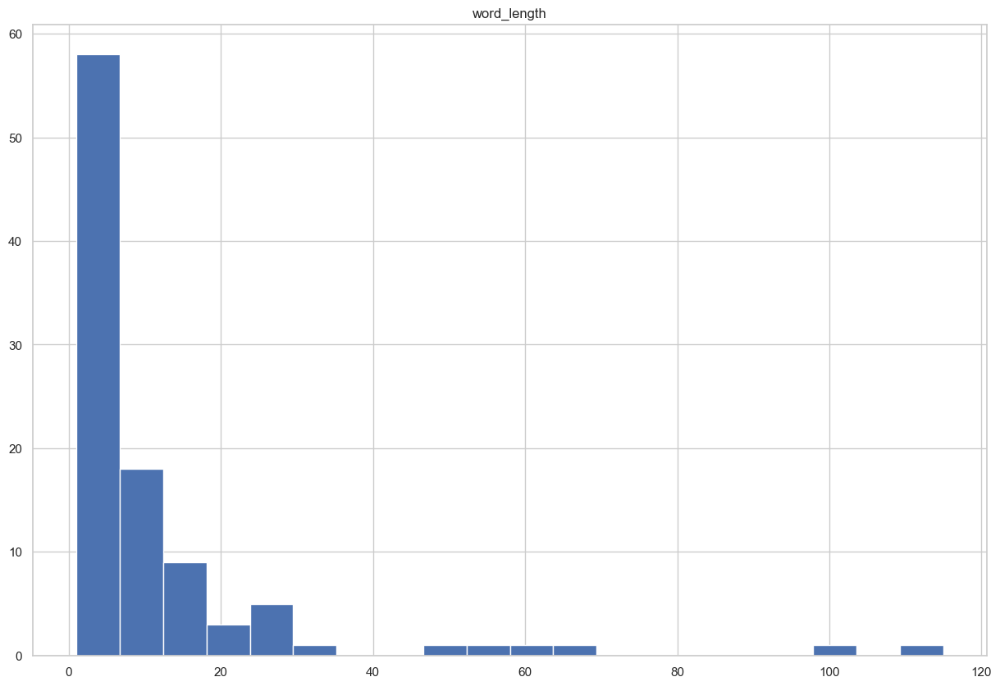

In [149]:
#Calculating text length
data_subsample[["word_length", "star_sentiment"]].hist(bins=20, figsize=(15, 10))

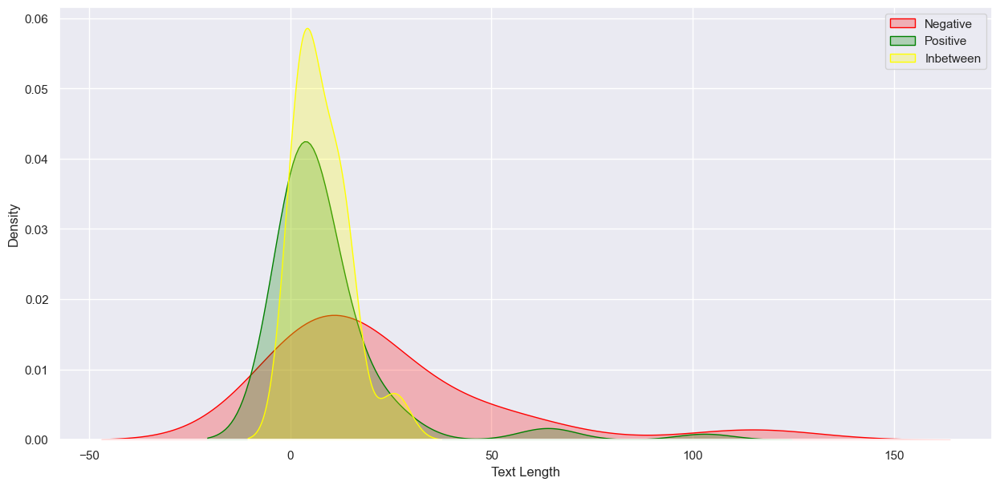

In [150]:
sns.set(color_codes=True)
plt.figure(figsize=(15,7))
cmap = ['red', 'green','yellow']
labels = ['Negative', 'Positive', 'Inbetween']

for label,clr in zip(labels,cmap):
    sns.kdeplot(data_subsample.loc[(data_subsample['star_sentiment'] == label),'word_length'], color=clr, shade=True, label=label)
    plt.xlabel('Text Length')
    plt.ylabel('Density')
    plt.legend()

##### cleansing after test

In [151]:
#removing punctuation and converting to lower case
import re
import string

def text_clean1(text):
    # lower text and escape punctuation
    text = text.lower()
    text = re.sub('[%s]' % re.escape(string.punctuation),'',text)
    return text

cleaned1 = lambda x: text_clean1(x)

# using function on columns
data['cleaned_reviewheadline'] = data['review_headline'].apply(cleaned1)
data['cleaned_reviewbody'] = data['review_body'].apply(cleaned1)

#Another round of cleaning
def text_clean2(text):
    # replace new line
    text = re.sub('\n','', text)
    return text

cleaned2 = lambda x: text_clean2(x)
data['cleaned_reviewheadline'] = data['cleaned_reviewheadline'].apply(cleaned2)
data['cleaned_reviewbody'] = data['cleaned_reviewbody'].apply(cleaned2)

data.head()


,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,total_votes,vine,verified_purchase,review_headline,review_body,review_date,rating_problems,review_date_year,cleaned_reviewheadline,cleaned_reviewbody
0,12039526,RTIS3L2M1F5SM,B001CXYMFS,737716809,Thrustmaster T-Flight Hotas X Flight Stick,Video Games,5,0,0,N,Y,an amazing joystick. i especially love that yo...,"used this for elite dangerous on my mac, an am...",2015-08-31,False,2015,an amazing joystick i especially love that you...,used this for elite dangerous on my mac an ama...
1,9636577,R1ZV7R40OLHKD,B00M920ND6,569686175,Tonsee 6 buttons Wireless Optical Silent Gamin...,Video Games,5,0,0,N,Y,definitely a silent mouse... not a single clic...,"loved it, i didn't even realise it was a gami...",2015-08-31,False,2015,definitely a silent mouse not a single click w...,loved it i didnt even realise it was a gaming...
2,2331478,R3BH071QLH8QMC,B0029CSOD2,98937668,Hidden Mysteries: Titanic Secrets of the Fatef...,Video Games,1,0,1,N,Y,one star,poor quality work and not as it is advertised.,2015-08-31,False,2015,one star,poor quality work and not as it is advertised
3,52495923,R127K9NTSXA2YH,B00GOOSV98,23143350,GelTabz Performance Thumb Grips - PlayStation ...,Video Games,3,0,0,N,Y,"good, but could be bettee","nice, but tend to slip away from stick in inte...",2015-08-31,False,2015,good but could be bettee,nice but tend to slip away from stick in inten...
4,14533949,R32ZWUXDJPW27Q,B00Y074JOM,821342511,Zero Suit Samus amiibo - Japan Import (Super S...,Video Games,4,0,0,N,Y,great but flawed.,"great amiibo, great for collecting. quality ma...",2015-08-31,False,2015,great but flawed,great amiibo great for collecting quality mate...


In [153]:
#Remove Stopwords
stopwords = stopwords.words('english')
data['cleaned_reviewbody'] = data['cleaned_reviewbody'].apply(lambda words: ' '.join(word.lower() for word in words.split() if word not in stopwords))
data.head()

,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,total_votes,vine,verified_purchase,review_headline,review_body,review_date,rating_problems,review_date_year,cleaned_reviewheadline,cleaned_reviewbody
0,12039526,RTIS3L2M1F5SM,B001CXYMFS,737716809,Thrustmaster T-Flight Hotas X Flight Stick,Video Games,5,0,0,N,Y,an amazing joystick. i especially love that yo...,"used this for elite dangerous on my mac, an am...",2015-08-31,False,2015,an amazing joystick i especially love that you...,used elite dangerous mac amazing joystick espe...
1,9636577,R1ZV7R40OLHKD,B00M920ND6,569686175,Tonsee 6 buttons Wireless Optical Silent Gamin...,Video Games,5,0,0,N,Y,definitely a silent mouse... not a single clic...,"loved it, i didn't even realise it was a gami...",2015-08-31,False,2015,definitely a silent mouse not a single click w...,loved didnt even realise gaming mouse typed 34...
2,2331478,R3BH071QLH8QMC,B0029CSOD2,98937668,Hidden Mysteries: Titanic Secrets of the Fatef...,Video Games,1,0,1,N,Y,one star,poor quality work and not as it is advertised.,2015-08-31,False,2015,one star,poor quality work advertised
3,52495923,R127K9NTSXA2YH,B00GOOSV98,23143350,GelTabz Performance Thumb Grips - PlayStation ...,Video Games,3,0,0,N,Y,"good, but could be bettee","nice, but tend to slip away from stick in inte...",2015-08-31,False,2015,good but could be bettee,nice tend slip away stick intense hard pressed...
4,14533949,R32ZWUXDJPW27Q,B00Y074JOM,821342511,Zero Suit Samus amiibo - Japan Import (Super S...,Video Games,4,0,0,N,Y,great but flawed.,"great amiibo, great for collecting. quality ma...",2015-08-31,False,2015,great but flawed,great amiibo great collecting quality material...


In [154]:
def lemmatize_text(text):
    lemmatizer = WordNetLemmatizer()
    return ' '.join([lemmatizer.lemmatize(w) for w in text.split(' ')])

data['cleaned_reviewbody'] = data['cleaned_reviewbody'].apply(lemmatize_text)
data.head()

In [155]:
#Text Exploratory Analysis
data['word_length'] = data['cleaned_reviewbody'].str.split().str.len()
data.head()

def sentiment(row):
    if row['star_rating'] == 5:
        return "Positive"
    elif row['star_rating'] == 1:
        return "Negative"
    elif  1 < row['star_rating'] < 5:
        return "Inbetween"
    else:
        return "Undefined"
    

data['star_sentiment'] = data.apply(sentiment,axis =1)
data.head()

,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,total_votes,vine,verified_purchase,review_headline,review_body,review_date,rating_problems,review_date_year,cleaned_reviewheadline,cleaned_reviewbody,word_length,star_sentiment
0,12039526,RTIS3L2M1F5SM,B001CXYMFS,737716809,Thrustmaster T-Flight Hotas X Flight Stick,Video Games,5,0,0,N,Y,an amazing joystick. i especially love that yo...,"used this for elite dangerous on my mac, an am...",2015-08-31,False,2015,an amazing joystick i especially love that you...,used elite dangerous mac amazing joystick espe...,17,Positive
1,9636577,R1ZV7R40OLHKD,B00M920ND6,569686175,Tonsee 6 buttons Wireless Optical Silent Gamin...,Video Games,5,0,0,N,Y,definitely a silent mouse... not a single clic...,"loved it, i didn't even realise it was a gami...",2015-08-31,False,2015,definitely a silent mouse not a single click w...,loved didnt even realise gaming mouse typed 34...,25,Positive
2,2331478,R3BH071QLH8QMC,B0029CSOD2,98937668,Hidden Mysteries: Titanic Secrets of the Fatef...,Video Games,1,0,1,N,Y,one star,poor quality work and not as it is advertised.,2015-08-31,False,2015,one star,poor quality work advertised,4,Negative
3,52495923,R127K9NTSXA2YH,B00GOOSV98,23143350,GelTabz Performance Thumb Grips - PlayStation ...,Video Games,3,0,0,N,Y,"good, but could be bettee","nice, but tend to slip away from stick in inte...",2015-08-31,False,2015,good but could be bettee,nice tend slip away stick intense hard pressed...,10,Inbetween
4,14533949,R32ZWUXDJPW27Q,B00Y074JOM,821342511,Zero Suit Samus amiibo - Japan Import (Super S...,Video Games,4,0,0,N,Y,great but flawed.,"great amiibo, great for collecting. quality ma...",2015-08-31,False,2015,great but flawed,great amiibo great collecting quality material...,9,Inbetween


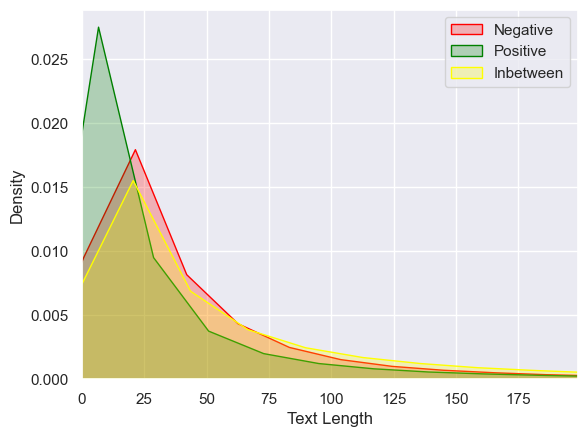

In [156]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(color_codes=True)
fig, ax = plt.subplots()
cmap = ['red', 'green','yellow']
labels = ['Negative', 'Positive', 'Inbetween']

for label,clr in zip(labels,cmap):
    sns.kdeplot(data.loc[(data['star_sentiment'] == label),'word_length'], ax=ax, color=clr, shade=True, label=label)
    ax.set_xlim(0,199)
    plt.title("Distribution of text length and reviews")
    plt.xlabel('Text Length')
    plt.ylabel('Density')
    plt.legend()


##### seperate english words

In [157]:
# Easy and approximate detection of english by scanning reviews for " the ", " and ", "but"
import numpy as np
english_words = ["great", "game", " and ", "the ", "but ", "good", " bad ", " this ", " my ", "awesome", "love", "have", " be ", " it ", " was ",\
     " an ", "they", "did", "not", "quality", "poor", "perfect", "it ", "for", "his", "work", "recommend", "nice", "excellent", "fantastic", "issues", "very", "my", "gift",\
        "with", "ok", "can", "just", "you", "memory", "thanks", "now", "uses", "fun", "too", "decent", "problems", "good", "want", "please", "want", "there", "are", "product", "believ",\
                "like", "again", "only", "much ", "please", " i ", "buy", "what", "money", "waste", " at ", "able", "worth", "try", "epic", "amazing",  "play", "brilliant", "don't",\
                        "better", " way", "about", "stupid", " run", "bring", "version", " of ", " as ", "it's", "ever", " me ", "how", " by "]
# Could use stopwords, but running time increases with every list member several seconds

data=data.dropna(subset="cleaned_reviewbody")
data["language"] = data["cleaned_reviewbody"].apply(lambda x: "EN" if (np.any([s in x.lower() for s in english_words])) else "OTHER")

In [158]:
data.value_counts("language")


language
EN       1848574
OTHER      76251
Name: count, dtype: int64

In [159]:
data[data["language"]!="EN"]["cleaned_reviewbody"].tail(40)

139050    wasnt expecting get email saying would right i...
139247    hey one dollarbr br one dollarbr br one dollar...
139346    sempre joguei civ desde 1° pro msdos e com tod...
139509    buen juego tiene caracteristicas de final fant...
139552    plesently suprised gave old quake doom feel no...
139608    code received wasnt complete missing alternate...
139884    bought kid babysitting easy control turtle u u...
140071    este juego lo recomiendo mucho es muy entreten...
140077    fue de maravilla con estos puntos una vez comp...
140181    optimo produto apesar de exigir uma conexão co...
140264    organized first one words appear alphabetical ...
140406    yo realize la compra del codigo de descarga el...
140589                                        one favorites
140777    subject interesting operation weak get stuck p...
140925    issue drm fixed amazon sega dropped original p...
141015             hd online ps3 dont title something wrong
141219    downloaded today anti virus wa

##### removing stopwords and stemming and tokenization

In [161]:
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))
from nltk.stem.snowball import EnglishStemmer
stemmer = EnglishStemmer()

stop_words.update(["car", "work", "product", "install"]) # --> data_en.pickle
# update the stop words manually after checking the word cloud result (see below) --> data_en2.pickle
# stop_words.update(["game", "br", "play", "get", "one", "would", "make", "first"])
# stop_words.update(["like", "control", "time"])

def tokenization_and_stemming(text):
    tokens = []
    # exclude stop words and tokenize the document, generate a list of string 
    for word in word_tokenize(text):
        if word.lower() not in stop_words:
            tokens.append(word.lower())

    filtered_tokens = []
    
    # filter out any tokens not containing letters (e.g., numeric tokens, raw punctuation)
    for token in tokens:
        if token.isalpha(): # filter out non alphabet words like emoji
            filtered_tokens.append(token)
            
    # stemming
    # Removes ing also in anything ...
    stems = [stemmer.stem(t) for t in filtered_tokens]
    return_string = " ".join(stems)
    
    return return_string


In [162]:
#data = data.dropna(subset=['review_body'])
data_en = data[data["language"]=="EN"]

In [163]:
# tokenization and stemming --> 35 min
processed_reviews = data_en["cleaned_reviewbody"].apply(lambda x: tokenization_and_stemming(x))

In [164]:
processed_reviews.head(3)

0    use elit danger mac amaz joystick especi love ...
1    love didnt even realis game mous type select o...
2                                poor qualiti advertis
Name: cleaned_reviewbody, dtype: object

In [165]:
data_en["processed_reviews"] = processed_reviews

##### export cleaned data

In [166]:
data_en.to_pickle(project_path + "/data/processed/data_en.pickle")

##### count_vectorization

In [167]:
tokens = processed_reviews.apply(lambda x: x.split(" "))
tokens.head()

0    [use, elit, danger, mac, amaz, joystick, espec...
1    [love, didnt, even, realis, game, mous, type, ...
2                            [poor, qualiti, advertis]
3    [nice, tend, slip, away, stick, intens, hard, ...
4    [great, amiibo, great, collect, qualiti, mater...
Name: cleaned_reviewbody, dtype: object

In [168]:
token_list = [item for sublist in list(tokens) for item in sublist] 
token_string = " ".join(token_list)

In [169]:
from sklearn.feature_extraction.text import CountVectorizer

def return_word_occurences(token_string, stopwords_in = None):
    vectorizer = CountVectorizer(stop_words = stopwords_in)
    #vectorizer.fit_transform(token_list)
    X = vectorizer.fit_transform([token_string])
    #vocab = vectorizer.vocabulary_
    words = vectorizer.get_feature_names_out()
    word_occurences = X.toarray().sum(axis=0)
    word_occurences_dict = dict(zip(words, word_occurences))
    sorted_occurences = sorted(word_occurences_dict.items(), key=lambda x: x[1], reverse=True)
    return sorted_occurences

In [170]:
sorted_occurences_initial = return_word_occurences(token_string)
sorted_occurences_initial

[('game', 3860235),
 ('play', 1288137),
 ('br', 998675),
 ('like', 909542),
 ('get', 836856),
 ('one', 788195),
 ('great', 669712),
 ('time', 606195),
 ('good', 561074),
 ('use', 501350),
 ('fun', 480644),
 ('realli', 465638),
 ('would', 435059),
 ('love', 424215),
 ('control', 418984),
 ('make', 406400),
 ('dont', 391631),
 ('much', 383451),
 ('even', 370189),
 ('go', 357923),
 ('also', 347461),
 ('first', 345999),
 ('buy', 342229),
 ('look', 337903),
 ('well', 334922),
 ('new', 326167),
 ('graphic', 321617),
 ('thing', 315044),
 ('want', 306864),
 ('charact', 287809),
 ('still', 273240),
 ('way', 267740),
 ('better', 266093),
 ('work', 264121),
 ('lot', 257998),
 ('im', 256057),
 ('stori', 248341),
 ('best', 246734),
 ('got', 236699),
 ('level', 236077),
 ('say', 234900),
 ('tri', 234289),
 ('take', 230613),
 ('player', 229442),
 ('littl', 222302),
 ('feel', 219781),
 ('think', 217270),
 ('need', 217082),
 ('mani', 215245),
 ('enjoy', 212099),
 ('system', 208219),
 ('year', 203889),


In [171]:
pd.DataFrame(sorted_occurences_initial).to_csv(project_path + "/data/word_occurences.csv")

##### Wordcloud

In [34]:
def wc_for_rating(rating, stopwords_in = None, max_words = 100, collocations = False):
    plt.figure(figsize = (20,20))
    wordcloud = WordCloud(collocations=collocations, stopwords = stopwords_in, max_words = max_words).generate(processed_review_string.loc[rating][0])
    # Display the generated image:
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

###### wordcloud with stop_words_cv

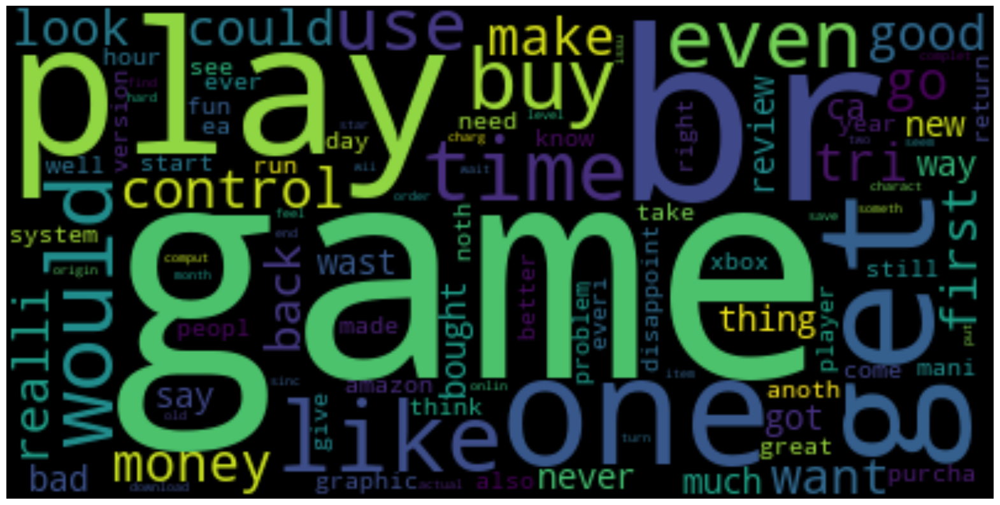

In [175]:
wc_for_rating(1, stopwords_in= stop_words)

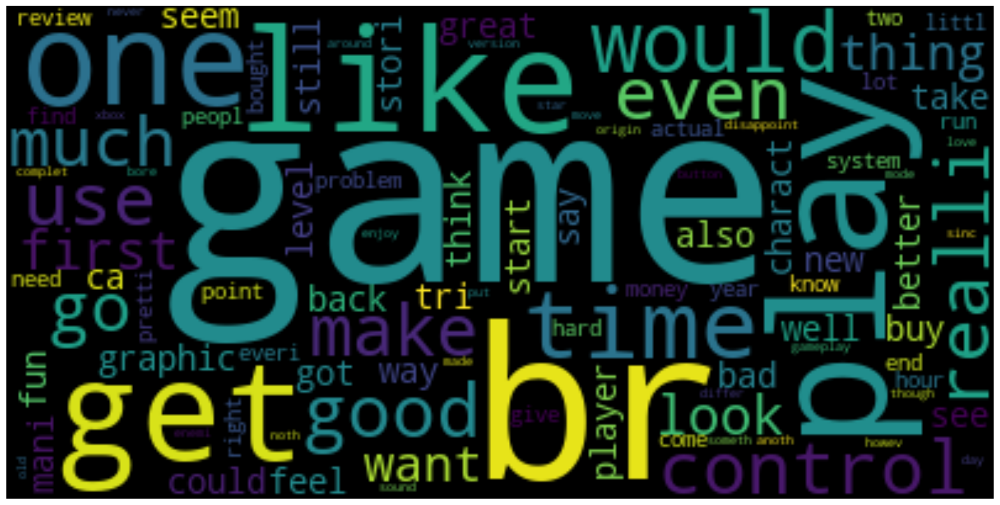

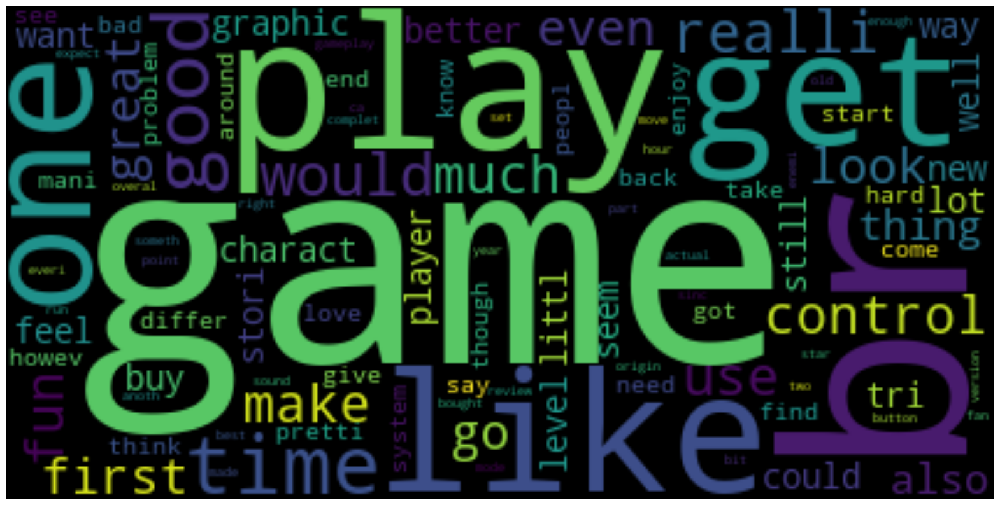

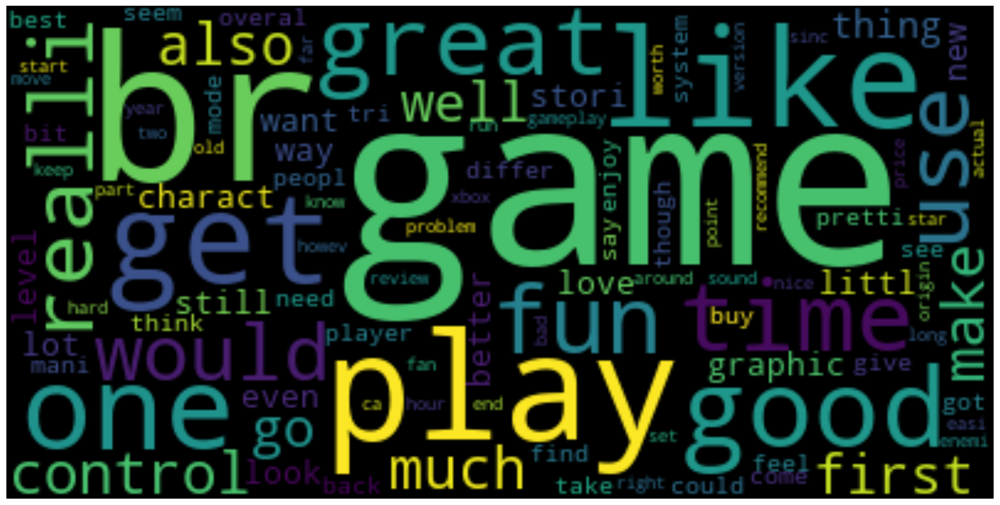

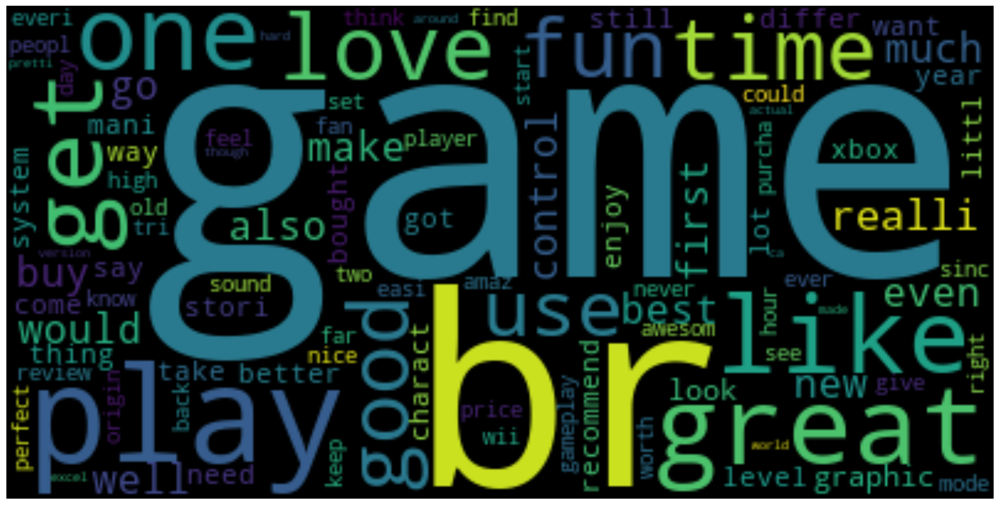

In [176]:
#wc_for_rating(1, stopwords_in= stop_words)
wc_for_rating(2, stopwords_in= stop_words)
wc_for_rating(3, stopwords_in= stop_words)
wc_for_rating(4, stopwords_in= stop_words)
wc_for_rating(5, stopwords_in= stop_words)

###### some other tests with stop words

In [177]:
#data = data.dropna(subset="processed_reviews")
# Lots of foreign languages in the dataset, thus filter for marketplace = US
tokens = processed_reviews.apply(lambda x: x.split(" "))


In [178]:
tokens.head()

0    [use, elit, danger, mac, amaz, joystick, espec...
1    [love, didnt, even, realis, game, mous, type, ...
2                            [poor, qualiti, advertis]
3    [nice, tend, slip, away, stick, intens, hard, ...
4    [great, amiibo, great, collect, qualiti, mater...
Name: cleaned_reviewbody, dtype: object

In [179]:
token_list = [item for sublist in list(tokens) for item in sublist] 
token_string = " ".join(token_list)

In [180]:
token_string = " ".join(token_list)

In [181]:
from sklearn.feature_extraction.text import CountVectorizer

def return_word_occurences(token_string, stopwords_in = None):
    vectorizer = CountVectorizer(stop_words = stopwords_in)
    #vectorizer.fit_transform(token_list)
    X = vectorizer.fit_transform([token_string])
    #vocab = vectorizer.vocabulary_
    words = vectorizer.get_feature_names_out()
    word_occurences = X.toarray().sum(axis=0)
    word_occurences_dict = dict(zip(words, word_occurences))
    sorted_occurences = sorted(word_occurences_dict.items(), key=lambda x: x[1], reverse=True)
    return sorted_occurences

In [182]:
sorted_occurences_initial = return_word_occurences(token_string)
sorted_occurences_initial

[('game', 3860235),
 ('play', 1288137),
 ('br', 998675),
 ('like', 909542),
 ('get', 836856),
 ('one', 788195),
 ('great', 669712),
 ('time', 606195),
 ('good', 561074),
 ('use', 501350),
 ('fun', 480644),
 ('realli', 465638),
 ('would', 435059),
 ('love', 424215),
 ('control', 418984),
 ('make', 406400),
 ('dont', 391631),
 ('much', 383451),
 ('even', 370189),
 ('go', 357923),
 ('also', 347461),
 ('first', 345999),
 ('buy', 342229),
 ('look', 337903),
 ('well', 334922),
 ('new', 326167),
 ('graphic', 321617),
 ('thing', 315044),
 ('want', 306864),
 ('charact', 287809),
 ('still', 273240),
 ('way', 267740),
 ('better', 266093),
 ('work', 264121),
 ('lot', 257998),
 ('im', 256057),
 ('stori', 248341),
 ('best', 246734),
 ('got', 236699),
 ('level', 236077),
 ('say', 234900),
 ('tri', 234289),
 ('take', 230613),
 ('player', 229442),
 ('littl', 222302),
 ('feel', 219781),
 ('think', 217270),
 ('need', 217082),
 ('mani', 215245),
 ('enjoy', 212099),
 ('system', 208219),
 ('year', 203889),


In [183]:
sorted_occurences_initial

[('game', 3860235),
 ('play', 1288137),
 ('br', 998675),
 ('like', 909542),
 ('get', 836856),
 ('one', 788195),
 ('great', 669712),
 ('time', 606195),
 ('good', 561074),
 ('use', 501350),
 ('fun', 480644),
 ('realli', 465638),
 ('would', 435059),
 ('love', 424215),
 ('control', 418984),
 ('make', 406400),
 ('dont', 391631),
 ('much', 383451),
 ('even', 370189),
 ('go', 357923),
 ('also', 347461),
 ('first', 345999),
 ('buy', 342229),
 ('look', 337903),
 ('well', 334922),
 ('new', 326167),
 ('graphic', 321617),
 ('thing', 315044),
 ('want', 306864),
 ('charact', 287809),
 ('still', 273240),
 ('way', 267740),
 ('better', 266093),
 ('work', 264121),
 ('lot', 257998),
 ('im', 256057),
 ('stori', 248341),
 ('best', 246734),
 ('got', 236699),
 ('level', 236077),
 ('say', 234900),
 ('tri', 234289),
 ('take', 230613),
 ('player', 229442),
 ('littl', 222302),
 ('feel', 219781),
 ('think', 217270),
 ('need', 217082),
 ('mani', 215245),
 ('enjoy', 212099),
 ('system', 208219),
 ('year', 203889),


In [184]:
# import re
# r = re.compile(r"[a-zA-Z]+")
# test = r.match('çáêôæíô')
# test2 = r.match('windshiield')

# token_list_an = [item for item in token_list_us if not (r.match(item) is None)] 

##### Update stopwords manually

In [185]:
# stop_words_cv = set(stopwords.words('english'))
# stop_words_cv.update(["game", "br", "play", "get", "one", "would", "make", "first"])

# #Update inspired by word cloud per rating class
# stop_words_cv_enh = stop_words_cv
# stop_words_cv_enh.update(["like", "control", "time"])

# sorted_occurences_sw = return_word_occurences(token_string, stopwords_in=stop_words_cv)
# sorted_occurences_sw

In [186]:
#data = data.dropna(subset="processed_reviews")
processed_review_string = data_en.groupby("star_rating").aggregate({"review_body":lambda x: " ".join(x)})

In [187]:
processed_review_string.loc[1]

review_body    poor quality work and not as it is advertised....
Name: 1, dtype: object

In [188]:
stop_words.update(["car", "work", "product", "install"]) # --> data_en.pickle
# update the stop words manually after checking the word cloud result (see below) --> data_en2.pickle
stop_words.update(["game", "br", "play", "get", "one", "would", "make", "first"])
stop_words.update(["like", "control", "time"])

def tokenization_and_stemming(text):
    tokens = []
    # exclude stop words and tokenize the document, generate a list of string 
    for word in word_tokenize(text):
        if word.lower() not in stop_words:
            tokens.append(word.lower())

    filtered_tokens = []
    
    # filter out any tokens not containing letters (e.g., numeric tokens, raw punctuation)
    for token in tokens:
        if token.isalpha(): # filter out non alphabet words like emoji
            filtered_tokens.append(token)
            
    # stemming
    # Removes ing also in anything ...
    stems = [stemmer.stem(t) for t in filtered_tokens]
    return_string = " ".join(stems)
    
    return return_string


In [189]:
#data = data.dropna(subset=['review_body'])
data_en = data[data["language"]=="EN"]

In [190]:
# tokenization and stemming --> takes 35 min
processed_reviews = data_en["cleaned_reviewbody"].apply(lambda x: tokenization_and_stemming(x))

In [191]:
processed_reviews.head(3)

0    use elit danger mac amaz joystick especi love ...
1    love didnt even realis game mous type select p...
2                                poor qualiti advertis
Name: cleaned_reviewbody, dtype: object

In [192]:
data_en["processed_reviews"] = processed_reviews

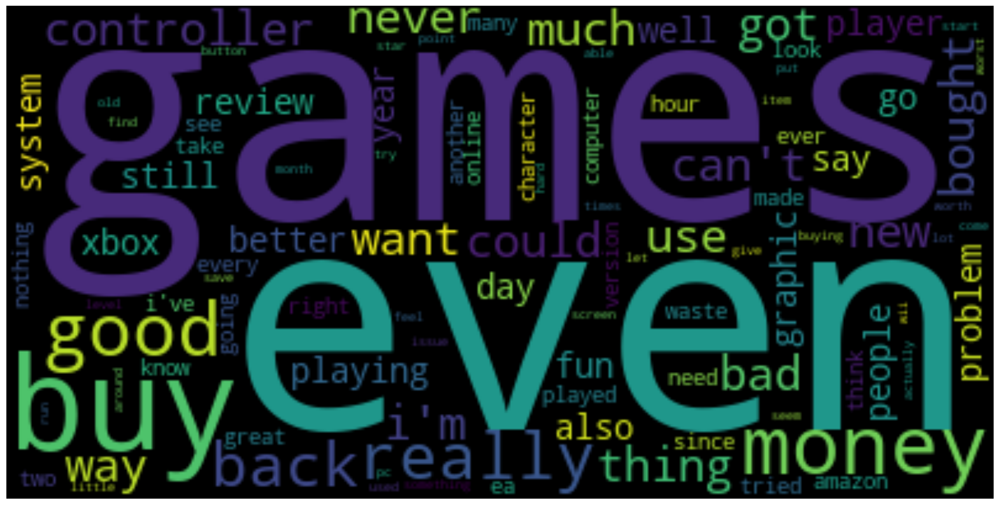

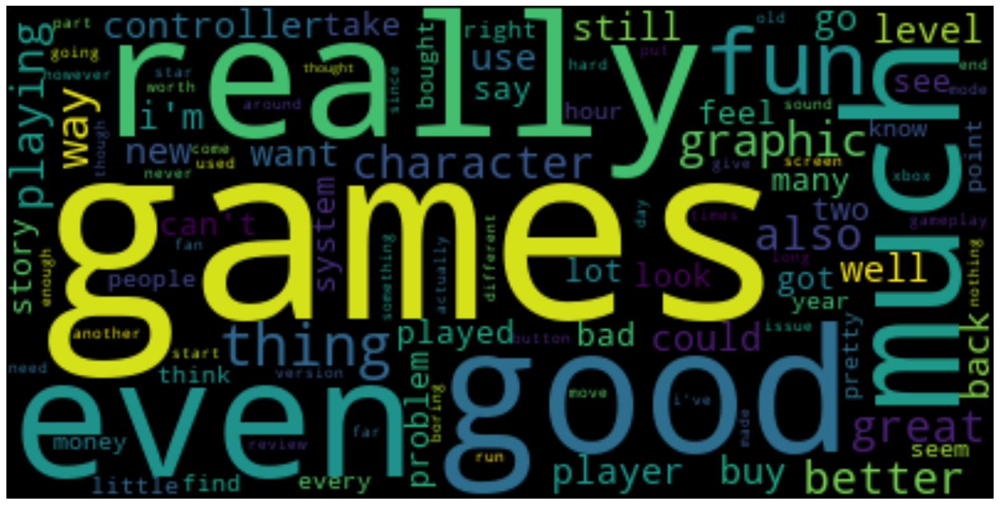

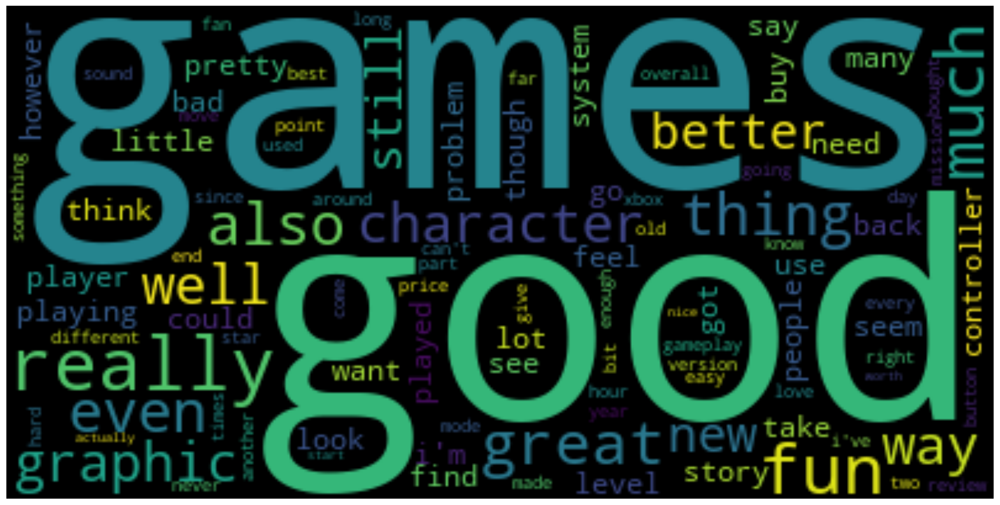

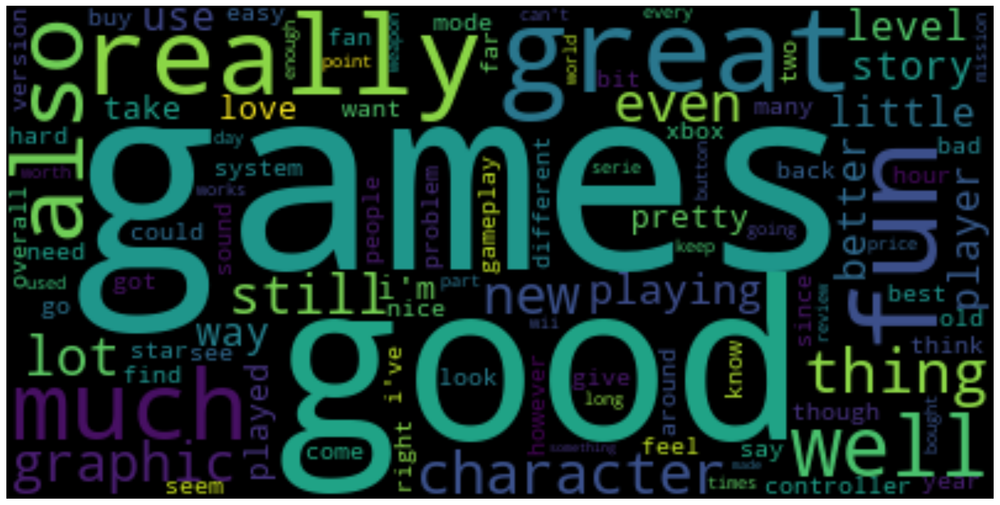

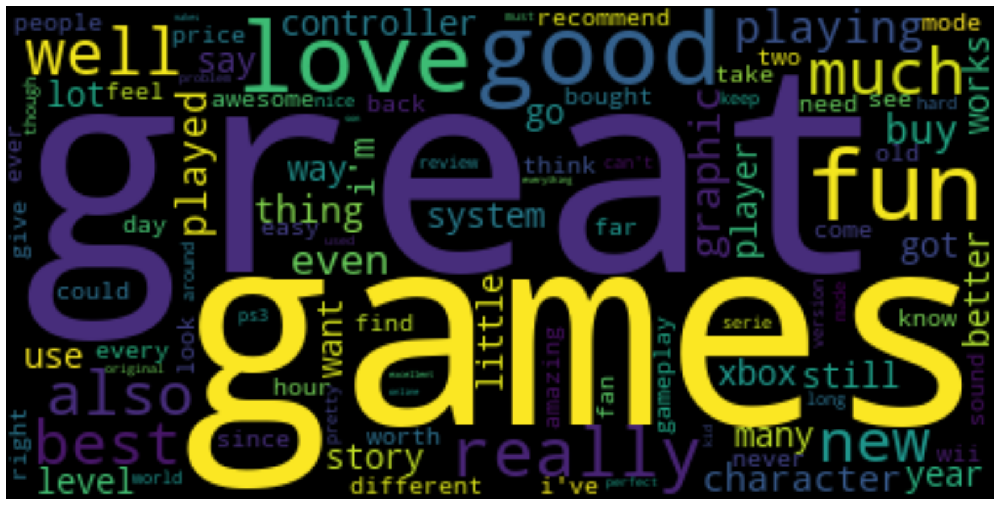

In [195]:
wc_for_rating(1, stopwords_in= stop_words)
wc_for_rating(2, stopwords_in= stop_words)
wc_for_rating(3, stopwords_in= stop_words)
wc_for_rating(4, stopwords_in= stop_words)
wc_for_rating(5, stopwords_in= stop_words)

### 3rd Data PreProcessing > Lemmitization and Posttagging using spacy

In [196]:
import spacy
nlp = spacy.load("en_core_web_lg")

In [197]:
# !pip install spacy
# !python -m spacy download en_core_web_lg

In [198]:
def lemmatize_and_pos_tag(review):
    doc = nlp(review)
    lst = []
    for tok in doc:
        if (tok.pos != 97 ) and (tok.pos_ != "SPACE") and (tok.is_alpha or tok.pos_== "PART") and (tok.ent_type_ == ''):
           lst.append(tok.lemma_ + "_" + tok.pos_)
    return " ".join(lst)

In [199]:
# process review headline: takes over 310 min
data_en["head_lem_pos_ner_rem"] = data_en.review_headline.apply(lambda x: lemmatize_and_pos_tag(str(x))) 

In [200]:
# process review body: takes 
data_en["lem_pos_ner_rem"] = data_en.processed_reviews.apply(lambda x: lemmatize_and_pos_tag(x)) 

In [201]:
# export data
# data_en.to_pickle(project_path + "\data\processed\data_en3.pickle") 

In [14]:
data_en = pd.read_pickle(project_path + "\data\processed\data_en3.pickle")

In [15]:
data_en.head()

,marketplace,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,total_votes,vine,verified_purchase,review_headline,review_body,review_date,language,processed_reviews,lem_pos_ner_rem,head_lem_pos_ner_rem
0,US,12039526,RTIS3L2M1F5SM,B001CXYMFS,737716809,Thrustmaster T-Flight Hotas X Flight Stick,Video Games,5,0,0,N,Y,an amazing joystick. I especially love that yo...,"Used this for Elite Dangerous on my mac, an am...",2015-08-31,EN,use elit danger mac amaz joystick especi love ...,use_VERB this_PRON for_ADP on_ADP my_PRON mac_...,an_DET amazing_ADJ joystick_NOUN I_PRON especi...
1,US,9636577,R1ZV7R40OLHKD,B00M920ND6,569686175,Tonsee 6 buttons Wireless Optical Silent Gamin...,Video Games,5,0,0,N,Y,Definitely a silent mouse... Not a single clic...,"Loved it, I didn't even realise it was a gami...",2015-08-31,EN,love even realis game mous type silent mous se...,love_VERB it_PRON I_PRON do_AUX not_PART even_...,definitely_ADV a_DET silent_ADJ mouse_NOUN not...
2,US,2331478,R3BH071QLH8QMC,B0029CSOD2,98937668,Hidden Mysteries: Titanic Secrets of the Fatef...,Video Games,1,0,1,N,Y,One Star,poor quality work and not as it is advertised.,2015-08-31,EN,poor qualiti advertis,poor_ADJ quality_NOUN work_NOUN and_CCONJ not_...,star_NOUN
3,US,52495923,R127K9NTSXA2YH,B00GOOSV98,23143350,GelTabz Performance Thumb Grips - PlayStation ...,Video Games,3,0,0,N,Y,"good, but could be bettee","nice, but tend to slip away from stick in inte...",2015-08-31,EN,nice tend slip away stick intens hard press ga...,nice_ADJ but_CCONJ tend_VERB to_PART slip_VERB...,good_ADJ but_CCONJ could_AUX be_AUX bettee_VERB
4,US,14533949,R32ZWUXDJPW27Q,B00Y074JOM,821342511,Zero Suit Samus amiibo - Japan Import (Super S...,Video Games,4,0,0,N,Y,Great but flawed.,"Great amiibo, great for collecting. Quality ma...",2015-08-31,EN,great amiibo great collect qualiti materi desi...,great_ADJ amiibo_NOUN great_ADJ for_ADP collec...,great_ADJ but_CCONJ flawed_ADJ


#### Visualization & wordcloud

In [16]:
#Text Exploratory Analysis
data_en['word_length'] = data_en['lem_pos_ner_rem'].str.split().str.len()

def sentiment(row):
    if (row['star_rating'] == 5) | (row['star_rating'] == 4):
            return "Positive"
    elif (row['star_rating'] == 1) | (row['star_rating'] == 2):
            return "Negative"
    elif row['star_rating'] == 3:
        return "Inbetween"
    else:
        return "Undefined"

data_en['star_sentiment'] = data_en.apply(sentiment,axis =1)
data_en.head()

,marketplace,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,total_votes,...,verified_purchase,review_headline,review_body,review_date,language,processed_reviews,lem_pos_ner_rem,head_lem_pos_ner_rem,word_length,star_sentiment
0,US,12039526,RTIS3L2M1F5SM,B001CXYMFS,737716809,Thrustmaster T-Flight Hotas X Flight Stick,Video Games,5,0,0,...,Y,an amazing joystick. I especially love that yo...,"Used this for Elite Dangerous on my mac, an am...",2015-08-31,EN,use elit danger mac amaz joystick especi love ...,use_VERB this_PRON for_ADP on_ADP my_PRON mac_...,an_DET amazing_ADJ joystick_NOUN I_PRON especi...,31,Positive
1,US,9636577,R1ZV7R40OLHKD,B00M920ND6,569686175,Tonsee 6 buttons Wireless Optical Silent Gamin...,Video Games,5,0,0,...,Y,Definitely a silent mouse... Not a single clic...,"Loved it, I didn't even realise it was a gami...",2015-08-31,EN,love even realis game mous type silent mous se...,love_VERB it_PRON I_PRON do_AUX not_PART even_...,definitely_ADV a_DET silent_ADJ mouse_NOUN not...,44,Positive
2,US,2331478,R3BH071QLH8QMC,B0029CSOD2,98937668,Hidden Mysteries: Titanic Secrets of the Fatef...,Video Games,1,0,1,...,Y,One Star,poor quality work and not as it is advertised.,2015-08-31,EN,poor qualiti advertis,poor_ADJ quality_NOUN work_NOUN and_CCONJ not_...,star_NOUN,9,Negative
3,US,52495923,R127K9NTSXA2YH,B00GOOSV98,23143350,GelTabz Performance Thumb Grips - PlayStation ...,Video Games,3,0,0,...,Y,"good, but could be bettee","nice, but tend to slip away from stick in inte...",2015-08-31,EN,nice tend slip away stick intens hard press ga...,nice_ADJ but_CCONJ tend_VERB to_PART slip_VERB...,good_ADJ but_CCONJ could_AUX be_AUX bettee_VERB,14,Inbetween
4,US,14533949,R32ZWUXDJPW27Q,B00Y074JOM,821342511,Zero Suit Samus amiibo - Japan Import (Super S...,Video Games,4,0,0,...,Y,Great but flawed.,"Great amiibo, great for collecting. Quality ma...",2015-08-31,EN,great amiibo great collect qualiti materi desi...,great_ADJ amiibo_NOUN great_ADJ for_ADP collec...,great_ADJ but_CCONJ flawed_ADJ,14,Positive


In [37]:
# export data
data_en.to_pickle(project_path + "\data\processed\data_en3_3sentiments.pickle") 

C:\Users\EQDIYCI\AppData\Local\Temp\ipykernel_6200\2317876123.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data_en.loc[(data_en['star_rating'] == label),'word_length'], ax=ax, color=clr, shade=True, label=label)
C:\Users\EQDIYCI\AppData\Local\Temp\ipykernel_6200\2317876123.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data_en.loc[(data_en['star_rating'] == label),'word_length'], ax=ax, color=clr, shade=True, label=label)
C:\Users\EQDIYCI\AppData\Local\Temp\ipykernel_6200\2317876123.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data_en.loc[(data_en['star_rating'] == label),'word_length'], ax=ax, color=c

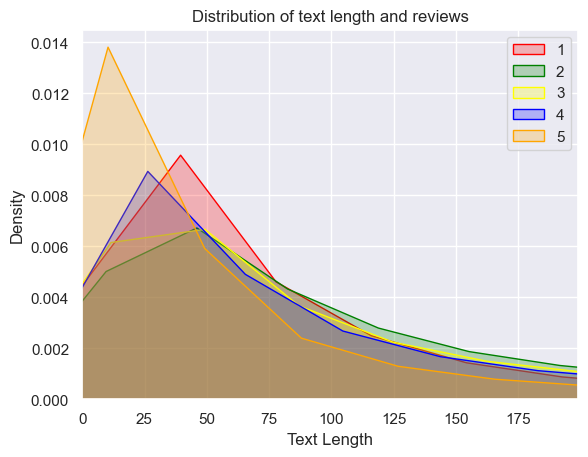

In [27]:
sns.set(color_codes=True)
fig, ax = plt.subplots()
cmap = ['red', 'green','yellow', 'blue', 'orange']
labels = [1, 2, 3, 4, 5]

for label,clr in zip(labels,cmap):
    sns.kdeplot(data_en.loc[(data_en['star_rating'] == label),'word_length'], ax=ax, color=clr, shade=True, label=label)
    ax.set_xlim(0,199)
    plt.title("Distribution of text length and reviews")
    plt.xlabel('Text Length')
    plt.ylabel('Density')
    plt.legend()

C:\Users\EQDIYCI\AppData\Local\Temp\ipykernel_6200\1547489273.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data_en.loc[(data_en['star_sentiment'] == label),'word_length'], ax=ax, color=clr, shade=True, label=label)
C:\Users\EQDIYCI\AppData\Local\Temp\ipykernel_6200\1547489273.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data_en.loc[(data_en['star_sentiment'] == label),'word_length'], ax=ax, color=clr, shade=True, label=label)
C:\Users\EQDIYCI\AppData\Local\Temp\ipykernel_6200\1547489273.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data_en.loc[(data_en['star_sentiment'] == label),'word_length'], ax=ax

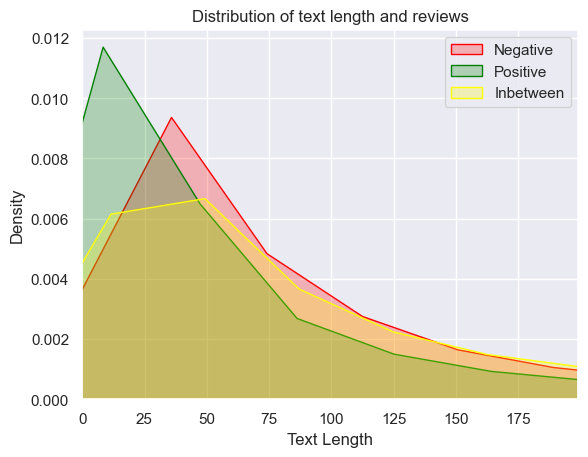

In [24]:
sns.set(color_codes=True)
fig, ax = plt.subplots()
cmap = ['red', 'green','yellow']
labels = ['Negative', 'Positive', 'Inbetween']

for label,clr in zip(labels,cmap):
    sns.kdeplot(data_en.loc[(data_en['star_sentiment'] == label),'word_length'], ax=ax, color=clr, shade=True, label=label)
    ax.set_xlim(0,199)
    plt.title("Distribution of text length and reviews")
    plt.xlabel('Text Length')
    plt.ylabel('Density')
    plt.legend()

In [39]:
processed_review_string = data_en.groupby("star_rating").aggregate({"processed_reviews":lambda x: " ".join(x)})

def wc_for_rating(rating):
    wordcloud = WordCloud(collocations=True).generate(processed_review_string.loc[rating][0][1:5000000].replace("one", "")\
                                                        .replace("use", "").replace(" br ", " ").replace("car", "").replace("work", "")\
                                                        .replace("game", "").replace("br", " ").replace("play", " ").replace("control", " ")\
                                                            .replace("even", " "))
    # Display the generated image:
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()
    return wordcloud

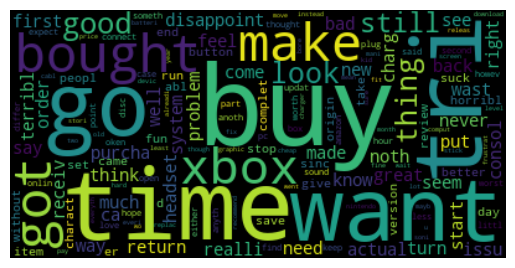

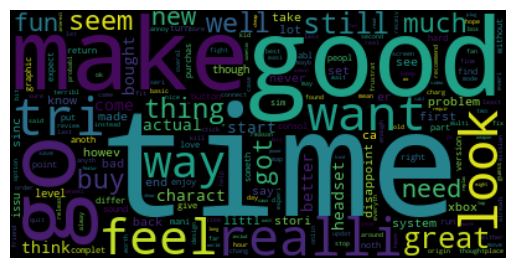

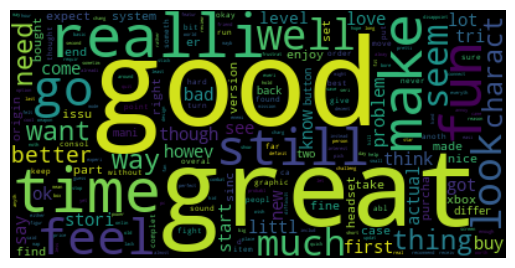

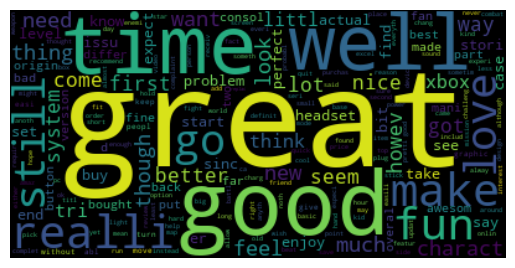

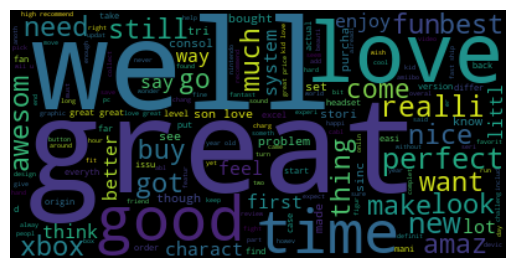

In [41]:
wc_for_rating(1)
wc_for_rating(2)
wc_for_rating(3)
wc_for_rating(4)
wc_for_rating(5)

### word2vec from gensim package

Reference: 

1.   https://www.kaggle.com/code/nitin194/twitter-sentiment-analysis-word2vec-doc2vec/#Word2Vec-Features
2.   https://www.kaggle.com/code/pierremegret/gensim-word2vec-tutorial



Reference the library: 
1.   https://radimrehurek.com/gensim/models/word2vec.html
2.   https://radimrehurek.com/gensim/auto_examples/tutorials/run_word2vec.html#



In [ ]:
from gensim.models import word2vec
import nltk
import gensim

In [ ]:
reviews = data_en['processed_reviews']

In [ ]:
# tokenization of reviews
tokenizer = nltk.WordPunctTokenizer() # extract the tokens from string of words or sentences in the form of Alphabetic and Non-Alphabetic character

tokenized_texts = [tokenizer.tokenize(review) for review in reviews]
print ("Tokenize the first review:")
print (tokenized_texts[0])

Tokenize the first review:
['use', 'elit', 'danger', 'mac', 'amaz', 'joystick', 'especi', 'love', 'twist', 'stick', 'differ', 'movement', 'bind', 'well', 'move', 'normal', 'way']


In [ ]:
reviews_postag = data_en['lem_pos_ner_rem']

In [ ]:
# tokenization of reviews with posttag
tokenized_texts_pos = [tokenizer.tokenize(review) for review in reviews_postag]
print ("Tokenize the first review:")
print (tokenized_texts_pos[0])

Tokenize the first review:
['use_VERB', 'this_PRON', 'for_ADP', 'on_ADP', 'my_PRON', 'mac_PROPN', 'an_DET', 'amazing_ADJ', 'joystick_NOUN', 'I_PRON', 'especially_ADV', 'love_VERB', 'that_PRON', 'you_PRON', 'can_AUX', 'twist_VERB', 'the_DET', 'stick_NOUN', 'for_ADP', 'different_ADJ', 'movement_NOUN', 'binding_NOUN', 'as_ADV', 'well_ADV', 'as_ADP', 'move_VERB', 'it_PRON', 'in_ADP', 'the_DET', 'normal_ADJ', 'way_NOUN']


In [ ]:
# or use the simple preprocess from gensim > strange. jump the 8th token? why
# review_text_w2v = data_en['processed_reviews'].apply(gensim.utils.simple_preprocess)

In [ ]:
# review_posttag_text_w2v = data_en.lem_pos_ner_rem.apply(gensim.utils.simple_preprocess)